In [1]:
import os, cv2, random
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
from matplotlib import ticker
import seaborn as sns
%matplotlib inline 

from keras.models import Sequential
from keras.layers import Input, Dropout, Flatten, Conv2D, MaxPooling2D, Dense, Activation
from keras.optimizers import RMSprop
from keras.callbacks import ModelCheckpoint, Callback, EarlyStopping
from keras.utils import np_utils
from keras import backend
backend.set_image_dim_ordering('th')

D:\Anaconda\lib\site-packages\h5py\__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [2]:
TRAIN_DIR = 'Folder/multitrain/'
TEST_DIR = 'Folder/test3/'

ROWS = 100
COLS = 100
CHANNELS = 3

train_images = [TRAIN_DIR+i for i in os.listdir(TRAIN_DIR)] 
train_images = [TRAIN_DIR+i for i in os.listdir(TRAIN_DIR) if '.DS_Store' not in i] # use this for full dataset

train_apples =    [TRAIN_DIR+i for i in os.listdir(TRAIN_DIR) if 'apple' in i]   #0
train_oranges =   [TRAIN_DIR+i for i in os.listdir(TRAIN_DIR) if 'orange' in i]  #2
train_kiwies =   [TRAIN_DIR+i for i in os.listdir(TRAIN_DIR) if 'kiwi' in i]     #1
train_pears =   [TRAIN_DIR+i for i in os.listdir(TRAIN_DIR) if 'pear' in i]      #3
train_persimmones =   [TRAIN_DIR+i for i in os.listdir(TRAIN_DIR) if 'persimmon' in i]   #4
#train_others =   [TRAIN_DIR+i for i in os.listdir(TRAIN_DIR) if 'other' in i]

test_images =  [TEST_DIR+i for i in os.listdir(TEST_DIR)if '.DS_Store' not in i]

tue = [1] * 500

for i in range(0,500):   
    if i>=0 and i<101:
        #print(i)
        tue[i] =0
    if i>100 and i<201:
        tue[i] =1
    if i>200 and i<301:
        tue[i] =2
    if i>300 and i<401:
        tue[i] =3
    if i>400 and i<501:
        tue[i] =4  

print(tue)

# slice datasets for memory efficiency on Kaggle Kernels, delete if using full dataset
train_images = train_apples[:1000] + train_oranges[:1000] + train_kiwies[:1000] + train_pears[:1000]+ train_persimmones[:1000] 
random.shuffle(train_images)
#test_images =  test_images[:100]
test_images =  test_images[:500]


def read_image(file_path):
    img = cv2.imread(file_path, cv2.IMREAD_COLOR) #cv2.IMREAD_GRAYSCALE
    img= cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    return cv2.resize(img, (ROWS, COLS), interpolation=cv2.INTER_CUBIC)


def prep_data(images):
    count = len(images)
    #data = np.ndarray((count, CHANNELS, ROWS, COLS), dtype=np.uint8)
    data = np.ndarray((count, CHANNELS, ROWS, COLS), dtype=np.uint8)

    for i, image_file in enumerate(images):
        image = read_image(image_file)
        data[i] = image.T
        if i%100 == 0: print('Processed {} of {}'.format(i, count))
    
    return data

train = prep_data(train_images)
test = prep_data(test_images)

print("Train shape: {}".format(train.shape))
print("Test shape: {}".format(test.shape))

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 

Text(0.5,1,'Five Category')

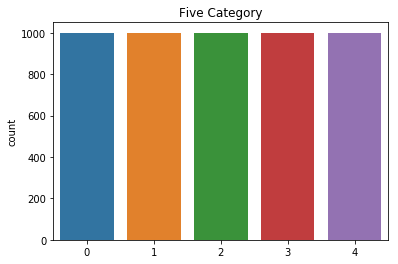

In [3]:
labels = []
for i in train_images:
    if 'kiwi' in i:
        labels.append(1)
    elif 'orange' in i:
        labels.append(2)
    elif 'pear' in i:
        labels.append(3)
    elif 'persimmon' in i:
        labels.append(4)     
    else:
        labels.append(0)

sns.countplot(labels)
plt.title('Five Category')

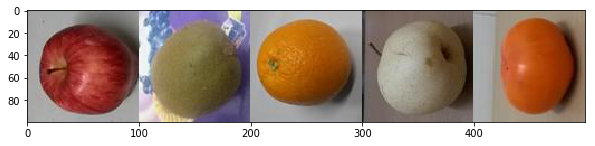

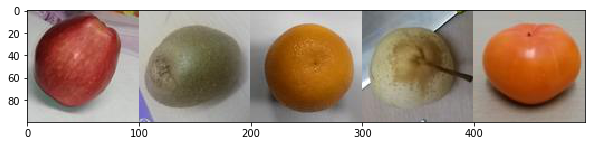

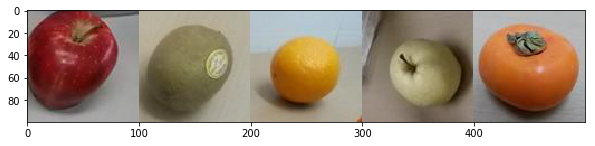

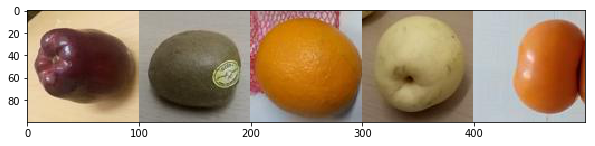

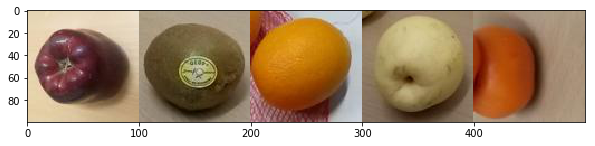

...

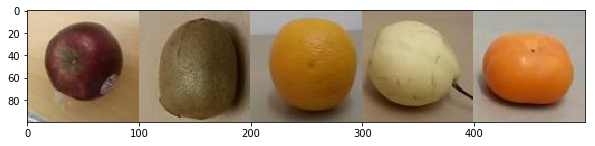

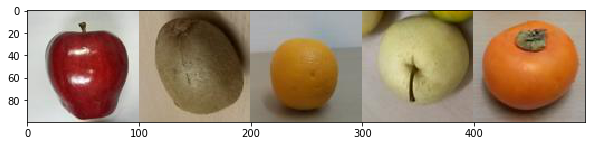

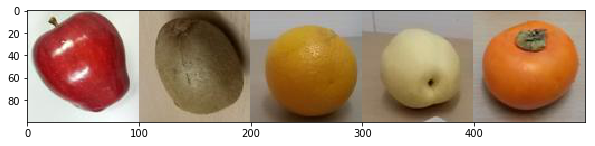

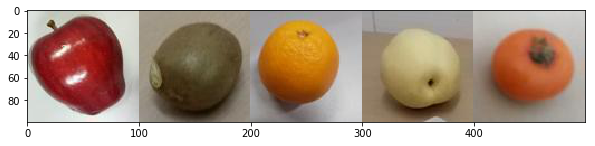

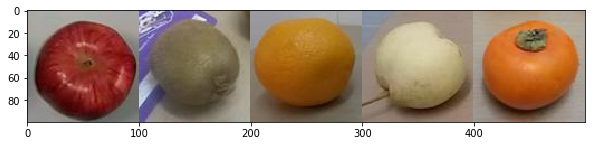

In [4]:
def show_apples_and_peaches(idx):
    apple = read_image(train_apples[idx])
    orange = read_image(train_oranges[idx])
    kiwi = read_image(train_kiwies[idx])
    pear = read_image(train_pears[idx])
    persimmon = read_image(train_persimmones[idx])
    pair = np.concatenate((apple, kiwi, orange,  pear, persimmon), axis=1)
    plt.figure(figsize=(10,8))
    plt.imshow(pair)
    plt.show()
    
for idx in range(0,25):
    show_apples_and_peaches(idx)

Text(0.5,1,' Average Apple')

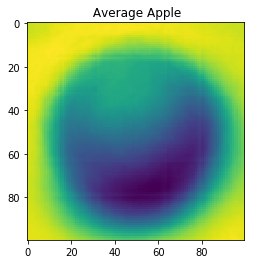

In [5]:
apple_avg = np.array([apple[0].T for i, apple in enumerate(train) if labels[i]==0]).mean(axis=0)
plt.imshow(apple_avg)
plt.title(' Average Apple')

Text(0.5,1,' Average kiwi')

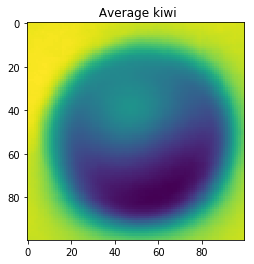

In [6]:
kiwi_avg = np.array([kiwi[0].T for i, kiwi in enumerate(train) if labels[i]==1]).mean(axis=0)
plt.imshow(kiwi_avg)
plt.title(' Average kiwi')

Text(0.5,1,' Average Orange')

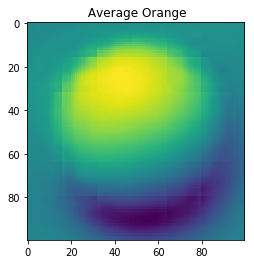

In [7]:
orange_avg = np.array([orange[0].T for i, orange in enumerate(train) if labels[i]==2]).mean(axis=0)
plt.imshow(orange_avg)
plt.title(' Average Orange')

Text(0.5,1,' Average Pear')

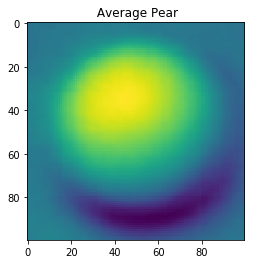

In [8]:
pear_avg = np.array([pear[0].T for i, pear in enumerate(train) if labels[i]==3]).mean(axis=0)
plt.imshow(pear_avg)
plt.title(' Average Pear')

Text(0.5,1,' Average Persimmon')

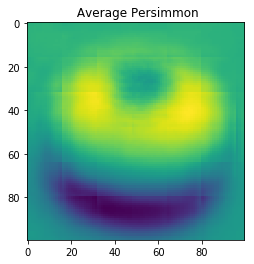

In [9]:
persimmon_avg = np.array([persimmon[0].T for i, persimmon in enumerate(train) if labels[i]==4]).mean(axis=0)
plt.imshow(persimmon_avg)
plt.title(' Average Persimmon')

In [10]:
#other_avg = np.array([other[0].T for i, other in enumerate(train) if labels[i]==8]).mean(axis=0)
#plt.imshow(other_avg)
#plt.title(' Average Other')

In [11]:
x_val=np.asarray(train[:10]) 
y_val=np.asarray(labels[:10])
print(x_val)
print(y_val)

[[[[ 93 114 137 ... 165 166 162]
   [102 120 141 ... 165 166 162]
   [114 130 147 ... 165 166 162]
   ...
   [163 164 164 ... 163 166 164]
   [163 164 164 ... 163 165 163]
   [164 164 165 ... 162 164 163]]

  [[ 74  95 119 ... 164 165 161]
   [ 83 102 123 ... 164 165 161]
   [ 96 112 129 ... 164 165 161]
   ...
   [162 163 163 ... 162 165 163]
   [162 163 163 ... 162 164 162]
   [163 163 164 ... 161 163 162]]

  [[ 60  81 105 ... 160 161 157]
   [ 69  88 111 ... 160 161 157]
   [ 84 100 117 ... 160 161 157]
   ...
   [158 159 159 ... 160 163 161]
   [158 159 159 ... 160 162 160]
   [159 159 160 ... 159 161 160]]]


 [[[170 168 167 ... 196 196 196]
   [170 168 167 ... 198 198 198]
   [171 169 168 ... 198 199 199]
   ...
   [176 177 178 ... 197 197 197]
   [176 176 177 ... 197 197 197]
   [175 176 177 ... 198 198 198]]

  [[150 148 147 ... 180 180 180]
   [150 148 147 ... 182 182 182]
   [151 149 148 ... 182 183 183]
   ...
   [159 160 161 ... 182 182 182]
   [159 159 160 ... 182 182 182

In [12]:
import keras.backend as K
optimizer = RMSprop(lr=1e-4)
objective = 'sparse_categorical_crossentropy'

def f2_score(y_true, y_pred):
    y_true = tf.cast(y_true, "int32")
    y_pred = tf.cast(tf.round(y_pred), "int32") # implicit 0.5 threshold via tf.round
    y_correct = y_true * y_pred
    sum_true = tf.reduce_sum(y_true, axis=1)
    sum_pred = tf.reduce_sum(y_pred, axis=1)
    sum_correct = tf.reduce_sum(y_correct, axis=1)
    precision = sum_correct / sum_pred
    recall = sum_correct / sum_true
    f_score = 5 * precision * recall / (4 * precision + recall)
    f_score = tf.where(tf.is_nan(f_score), tf.zeros_like(f_score), f_score)
    return tf.reduce_mean(f_score)

def f1_score(y_true, y_pred):

    # Count positive samples.
    c1 = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    c2 = K.sum(K.round(K.clip(y_pred, 0, 1)))
    c3 = K.sum(K.round(K.clip(y_true, 0, 1)))

    # If there are no true samples, fix the F1 score at 0.
    if c3 == 0:
        return 0

    # How many selected items are relevant?
    precision = c1 / c2

    # How many relevant items are selected?
    recall = c1 / c3

    # Calculate f1_score
    f1_score = 2 * (precision * recall) / (precision + recall)
    return f1_score

def applepeach():
    
    model = Sequential()

    model.add(Conv2D(32, (3, 3), padding='same', input_shape=(3,ROWS, COLS), activation='relu'))
    model.add(Conv2D(32, (3, 3), padding='same', activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2),data_format="channels_first"))

    model.add(Conv2D(64, (3, 3), padding='same', activation='relu'))
    model.add(Conv2D(64, (3, 3), padding='same', activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2),data_format="channels_first"))
    
    model.add(Conv2D(128, (3, 3), padding='same', activation='relu'))
    model.add(Conv2D(128, (3, 3), padding='same', activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2),data_format="channels_first"))
    
    model.add(Conv2D(256, (3, 3), padding='same', activation='relu'))
    model.add(Conv2D(256, (3, 3), padding='same', activation='relu'))
#     model.add(Convolution2D(256, 3, 3, border_mode='same', activation='relu'))
    model.add(MaxPooling2D(pool_size=(2, 2),data_format="channels_first"))

#     model.add(Convolution2D(256, 3, 3, border_mode='same', activation='relu'))
#     model.add(Convolution2D(256, 3, 3, border_mode='same', activation='relu'))
#     model.add(Convolution2D(256, 3, 3, border_mode='same', activation='relu'))
#     model.add(MaxPooling2D(pool_size=(2, 2)))

    model.add(Flatten())
    model.add(Dense(256, activation='relu'))
    model.add(Dropout(0.5))
    
    model.add(Dense(256, activation='relu'))
    model.add(Dropout(0.5))

    model.add(Dense(5))
    model.add(Activation('sigmoid'))

    model.compile(loss=objective, optimizer=optimizer, metrics=['accuracy', f1_score])
    return model


model = applepeach()
model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 32, 100, 100)      896       
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 32, 100, 100)      9248      
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 32, 50, 50)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 64, 50, 50)        18496     
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 64, 50, 50)        36928     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 64, 25, 25)        0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 128, 25, 25)       73856     
__________

In [13]:
nb_epoch = 10
batch_size = 16

## Callback for loss logging per epoch
class LossHistory(Callback):
    def on_train_begin(self, logs={}):
        self.losses = []
        self.val_losses = []
        self.val_f1s = []
        self.val_recalls = []
        self.accs = []
        self.val_accs = []
        self.val_precisions = []
        
    def on_epoch_end(self, batch, logs={}):
        self.losses.append(logs.get('loss'))
        self.val_f1s.append(logs.get('f1_score'))
        self.val_losses.append(logs.get('val_loss'))
        self.accs.append(logs.get('acc'))
        self.val_accs.append(logs.get('val_accuracy'))
        
early_stopping = EarlyStopping(monitor='val_loss', patience=3, verbose=1, mode='auto')        
        
def run_applepeach():
    
    history = LossHistory()
    model.fit(train, labels, batch_size=batch_size, epochs=nb_epoch,
                validation_split=0.25, verbose=0, shuffle=True, callbacks=[history, early_stopping],initial_epoch=0)
    predictions = model.predict(test, verbose=0)
    return predictions, history

predictions, history = run_applepeach()
print(predictions)
print(history)

Epoch 00010: early stopping
[[1.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 4.2446265e-34]
 [1.0000000e+00 1.6339109e-26 1.6819748e-25 2.2656574e-27 5.6669924e-20]
 [1.0000000e+00 4.7617321e-38 3.9351524e-37 5.5124467e-37 6.8570333e-28]
 ...
 [5.7591166e-26 3.4153870e-22 6.3338021e-24 3.9842958e-26 1.0000000e+00]
 [5.7591166e-26 3.4153870e-22 6.3338021e-24 3.9842958e-26 1.0000000e+00]
 [5.7591166e-26 3.4153870e-22 6.3338021e-24 3.9842958e-26 1.0000000e+00]]


In [14]:
y_pred=[]
print()

In [15]:
score = model.evaluate(train, labels, verbose=0)


In [17]:
print('Test score:', score[0])
print('Test accuracy:', score[1])
print(score)
print(history.losses)
print(history.val_losses)
print(history.val_accs)
print(history.accs)

Test score: 0.01621893836602758
Test accuracy: 0.9978
[0.01621893836602758, 0.9978, 0.8879327883720398]
[0.9470717102328936, 0.30322662530293065, 0.15168308362017074, 0.12109983314536511, 0.10196028509937848, 0.08134288909259485, 0.05483024160330533, 0.06456012012313271, 0.047141307698914656, 0.13901059338902425]
[0.18650297775268554, 0.18611109318286181, 0.14082024629563092, 0.11490842247782275, 0.03469915248625912, 0.03690929337855105, 0.03429469999446446, 0.039013558205736626, 0.08180839057990962, 0.048744176236313524]
[None, None, None, None, None, None, None, None, None, None]
[0.6136, 0.9138666666666667, 0.9610666666666666, 0.9752, 0.9802666666666666, 0.9821333333333333, 0.9882666666666666, 0.9874666666666667, 0.9917333333333334, 0.9805333333333334]


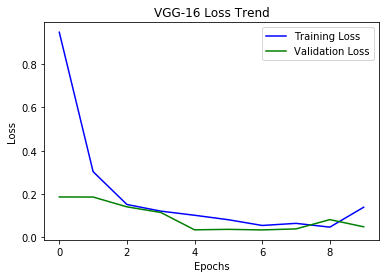

In [18]:
loss = history.losses
val_loss = history.val_losses

plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('VGG-16 Loss Trend')
plt.plot(loss, 'blue', label='Training Loss')
plt.plot(val_loss, 'green', label='Validation Loss')
plt.xticks(range(0,nb_epoch)[0::2])
plt.legend()
plt.show()

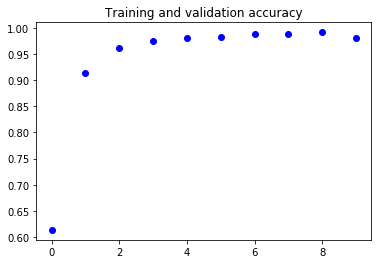

In [19]:
accuracy = history.accs 
val_accuracy = history.val_accs
epochs = range(len(accuracy))
plt.plot(epochs, accuracy, 'bo', label='Training accuracy')
plt.plot(epochs, val_accuracy, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.show()

In [47]:
recall= history.val_recalls
precisions=self.val_precisions = []

NameError: name 'self' is not defined

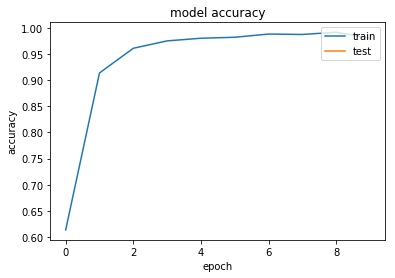

In [23]:
accuracy = history.accs 
val_accuracy = history.val_accs
plt.plot(accuracy)
plt.plot(val_accuracy)
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper right')
plt.show()

In [24]:
accuracy = fashion_train.history['acc']
val_accuracy = fashion_train.history['val_acc']
epochs = range(len(accuracy))
plt.plot(epochs, accuracy, 'bo', label='Training accuracy')
plt.plot(epochs, val_accuracy, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.show()

NameError: name 'fashion_train' is not defined

In [25]:
pred =[]
for i in range(0,500):
    print("next image to test==========="+ str(i))
    print(predictions[i])
    #index_min = np.argmin(predictions[i])
    ind = np.argmax(predictions[i])
    pred.append(ind)
    print(ind)

next image to test===========0
[1.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 4.2446265e-34]
0
next image to test===========1
[1.0000000e+00 1.6339109e-26 1.6819748e-25 2.2656574e-27 5.6669924e-20]
0
next image to test===========2
[1.0000000e+00 4.7617321e-38 3.9351524e-37 5.5124467e-37 6.8570333e-28]
0
next image to test===========3
[1.0000000e+00 7.0686689e-32 7.6584045e-32 1.3715433e-31 1.4508840e-23]
0
next image to test===========4
[1.0000000e+00 4.0265830e-29 1.6829286e-28 5.8940167e-29 1.9647749e-21]
0
next image to test===========5
[1.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 6.41053e-35]
0
next image to test===========6
[1.0000000e+00 7.9795547e-35 9.3767112e-35 1.5813939e-35 6.9081217e-29]
0
next image to test===========7
[1.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 9.3396853e-29]
0
next image to test===========8
[1.0000000e+00 0.0000000e+00 0.0000000e+00 0.0000000e+00 2.1310638e-32]
0
next image to test===========9
[1.0000000e+00 0.0000000e+00 0.000

next image to test===========110
[3.4708820e-09 9.9990666e-01 8.3255741e-10 4.1268957e-09 8.5027665e-09]
1
next image to test===========111
[3.4708820e-09 9.9990666e-01 8.3255741e-10 4.1268957e-09 8.5027665e-09]
1
next image to test===========112
[2.4561662e-11 9.9999750e-01 8.3753933e-14 3.6843686e-13 3.9160047e-12]
1
next image to test===========113
[2.4561662e-11 9.9999750e-01 8.3753933e-14 3.6843686e-13 3.9160047e-12]
1
next image to test===========114
[5.5522092e-10 9.9998057e-01 1.1730805e-12 4.0089082e-12 6.3637054e-11]
1
next image to test===========115
[5.5522092e-10 9.9998057e-01 1.1730805e-12 4.0089082e-12 6.3637054e-11]
1
next image to test===========116
[7.4262202e-10 9.9995673e-01 2.1146729e-10 8.6585530e-09 7.4373365e-09]
1
next image to test===========117
[7.4262202e-10 9.9995673e-01 2.1146729e-10 8.6585530e-09 7.4373365e-09]
1
next image to test===========118
[1.1918989e-09 9.9442482e-01 2.0911617e-09 1.9250541e-05 3.1329242e-07]
1
next image to test===========119
[1.1

 1.12834385e-14]
3
next image to test===========362
[2.4724758e-15 6.5195909e-14 1.6592439e-13 1.0000000e+00 1.1729038e-12]
3
next image to test===========363
[2.4724758e-15 6.5195909e-14 1.6592439e-13 1.0000000e+00 1.1729038e-12]
3
next image to test===========364
[1.6165467e-17 8.5228654e-17 7.3587334e-15 1.0000000e+00 4.1902733e-15]
3
next image to test===========365
[1.9215075e-16 4.3974203e-15 1.8868758e-14 1.0000000e+00 1.0576449e-13]
3
next image to test===========366
[1.9215075e-16 4.3974203e-15 1.8868758e-14 1.0000000e+00 1.0576449e-13]
3
next image to test===========367
[6.9154449e-16 2.7100624e-14 7.6866607e-14 1.0000000e+00 7.9387468e-13]
3
next image to test===========368
[2.1161584e-13 5.9401256e-12 6.6735437e-12 9.9999988e-01 3.2703985e-11]
3
next image to test===========369
[8.5291718e-14 2.7981725e-12 6.2983143e-12 9.9999988e-01 1.9720347e-11]
3
next image to test===========370
[8.1063682e-14 6.4965346e-12 2.2418172e-12 9.9999952e-01 1.2659096e-10]
3
next image to test

In [26]:
print(pred)
print(tue)

[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 

testing image============== 0
apple
I am 100.00% sure


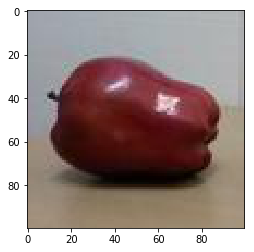

testing image============== 1
apple
I am 100.00% sure


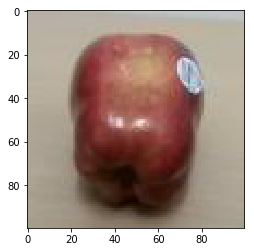

testing image============== 2
apple
I am 100.00% sure


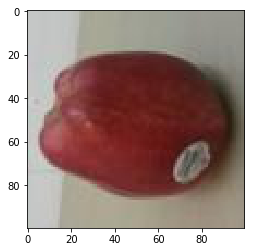

testing image============== 3
apple
I am 100.00% sure


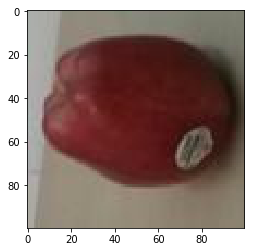

testing image============== 4
apple
I am 100.00% sure


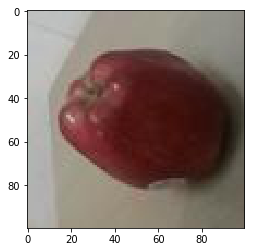

testing image============== 5
apple
I am 100.00% sure


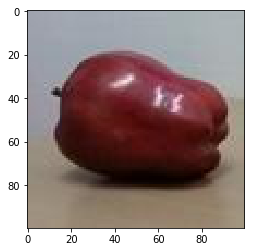

testing image============== 6
apple
I am 100.00% sure


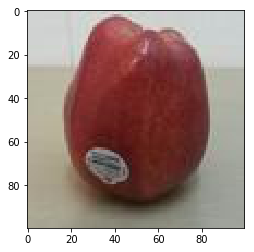

testing image============== 7
apple
I am 100.00% sure


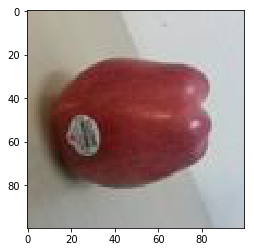

testing image============== 8
apple
I am 100.00% sure


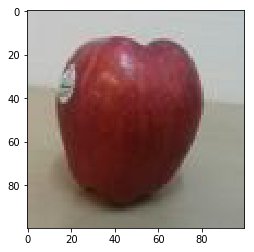

testing image============== 9
apple
I am 100.00% sure


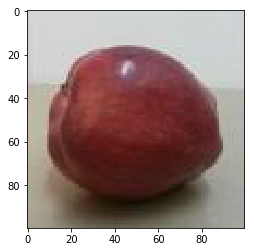

testing image============== 10
apple
I am 100.00% sure


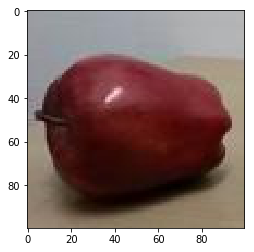

testing image============== 11
apple
I am 100.00% sure


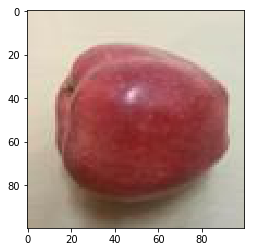

testing image============== 12
apple
I am 100.00% sure


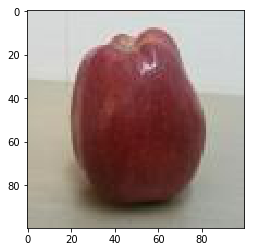

testing image============== 13
apple
I am 100.00% sure


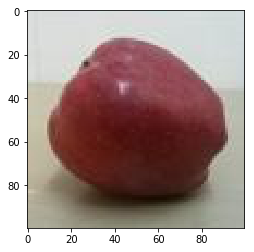

testing image============== 14
apple
I am 100.00% sure


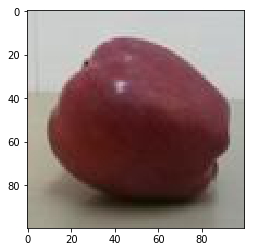

testing image============== 15
apple
I am 100.00% sure


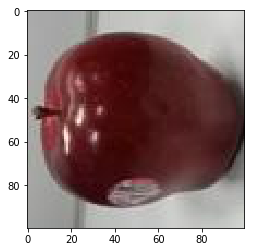

testing image============== 16
apple
I am 100.00% sure


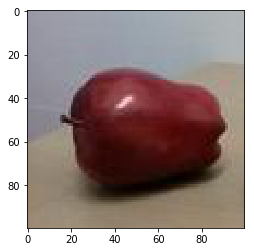

testing image============== 17
apple
I am 100.00% sure


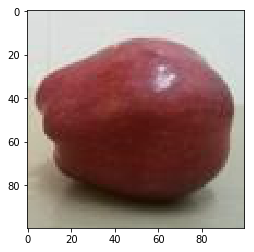

testing image============== 18
apple
I am 100.00% sure


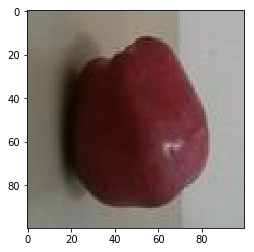

testing image============== 19
apple
I am 100.00% sure


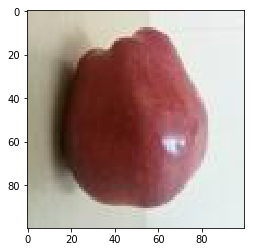

testing image============== 20
apple
I am 100.00% sure


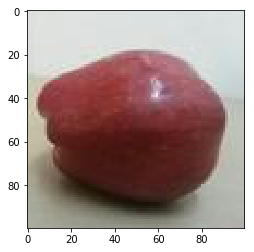

testing image============== 21
apple
I am 100.00% sure


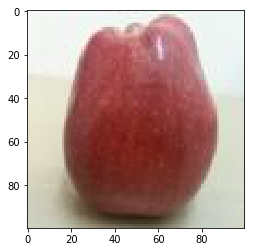

testing image============== 22
apple
I am 100.00% sure


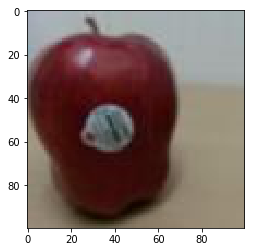

testing image============== 23
apple
I am 100.00% sure


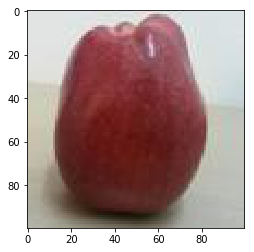

testing image============== 24
apple
I am 100.00% sure


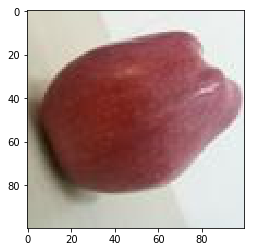

testing image============== 25
apple
I am 100.00% sure


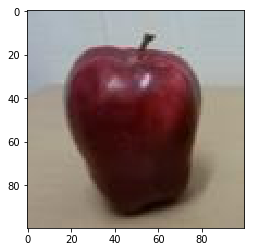

testing image============== 26
apple
I am 100.00% sure


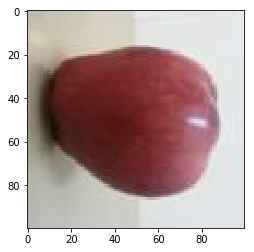

testing image============== 27
apple
I am 100.00% sure


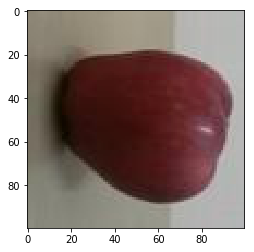

testing image============== 28
apple
I am 100.00% sure


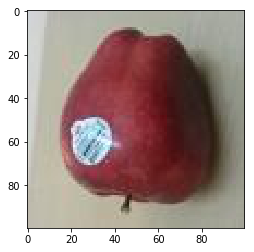

testing image============== 29
apple
I am 100.00% sure


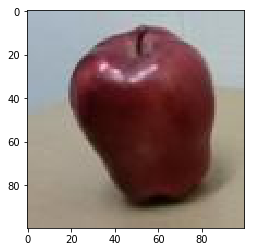

testing image============== 30
apple
I am 100.00% sure


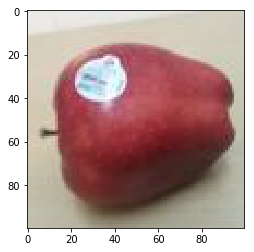

testing image============== 31
apple
I am 100.00% sure


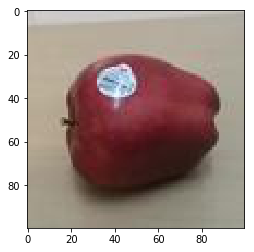

testing image============== 32
apple
I am 100.00% sure


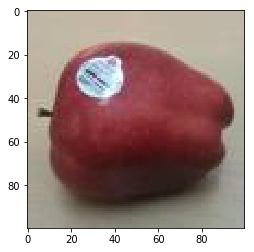

testing image============== 33
apple
I am 100.00% sure


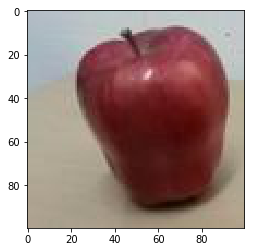

testing image============== 34
apple
I am 100.00% sure


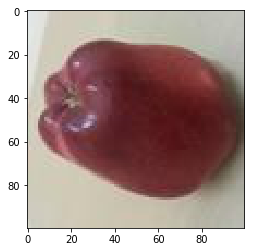

testing image============== 35
apple
I am 100.00% sure


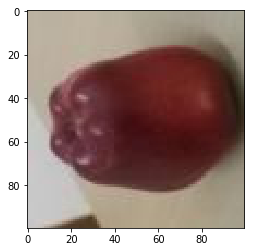

testing image============== 36
apple
I am 100.00% sure


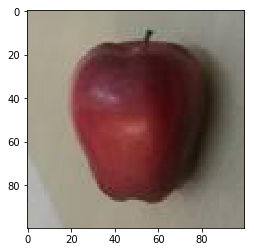

testing image============== 37
apple
I am 100.00% sure


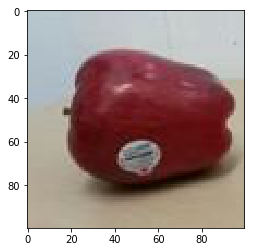

testing image============== 38
apple
I am 100.00% sure


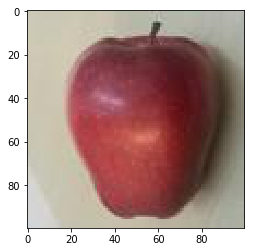

testing image============== 39
apple
I am 100.00% sure


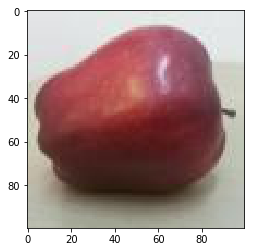

testing image============== 40
apple
I am 100.00% sure


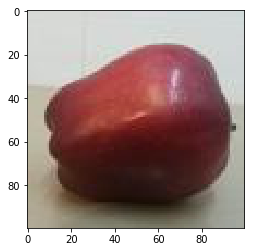

testing image============== 41
apple
I am 100.00% sure


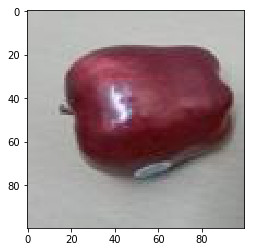

testing image============== 42
apple
I am 100.00% sure


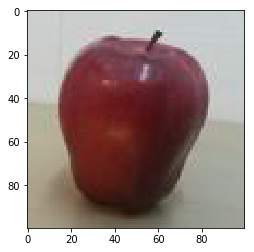

testing image============== 43
apple
I am 100.00% sure


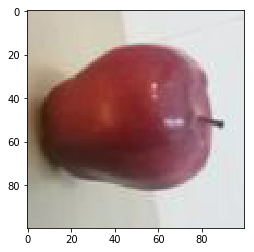

testing image============== 44
apple
I am 100.00% sure


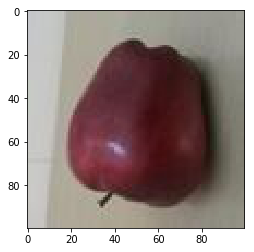

testing image============== 45
apple
I am 100.00% sure


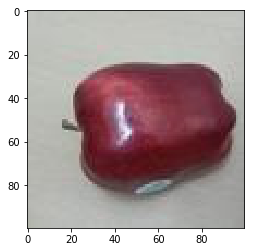

testing image============== 46
apple
I am 100.00% sure


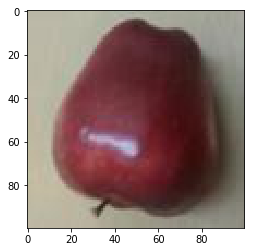

testing image============== 47
apple
I am 100.00% sure


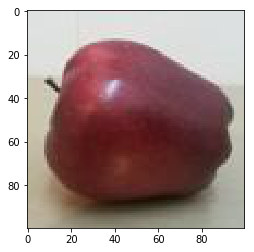

testing image============== 48
apple
I am 100.00% sure


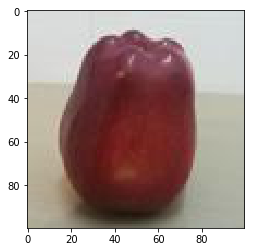

testing image============== 49
apple
I am 100.00% sure


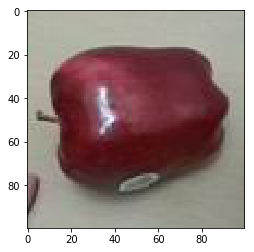

testing image============== 50
apple
I am 100.00% sure


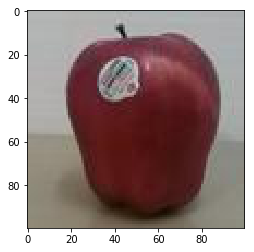

testing image============== 51
apple
I am 100.00% sure


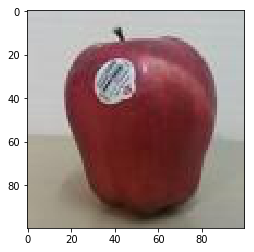

testing image============== 52
apple
I am 100.00% sure


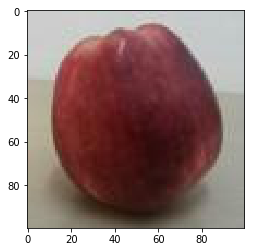

testing image============== 53
apple
I am 100.00% sure


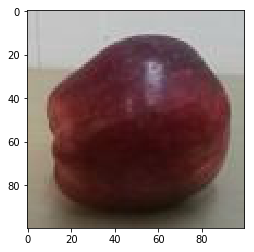

testing image============== 54
apple
I am 100.00% sure


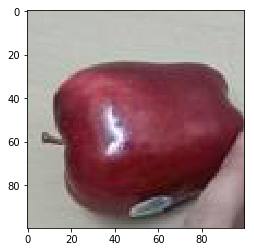

testing image============== 55
apple
I am 100.00% sure


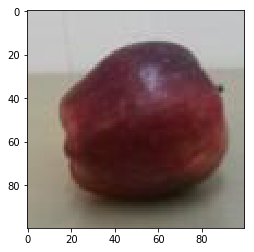

testing image============== 56
apple
I am 100.00% sure


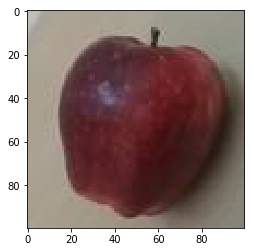

testing image============== 57
apple
I am 100.00% sure


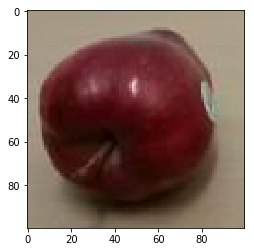

testing image============== 58
apple
I am 100.00% sure


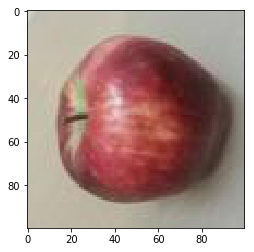

testing image============== 59
apple
I am 100.00% sure


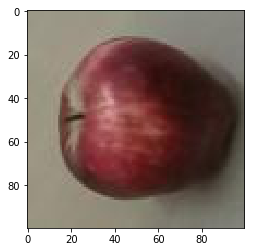

testing image============== 60
apple
I am 100.00% sure


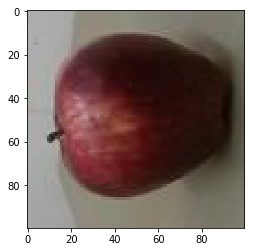

testing image============== 61
apple
I am 100.00% sure


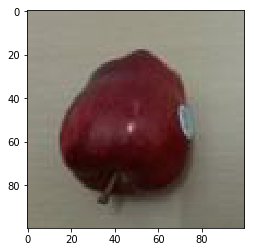

testing image============== 62
apple
I am 100.00% sure


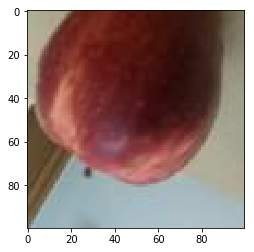

testing image============== 63
apple
I am 100.00% sure


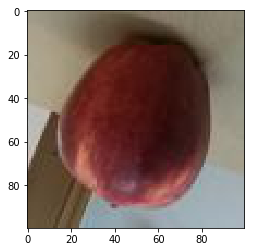

testing image============== 64
apple
I am 100.00% sure


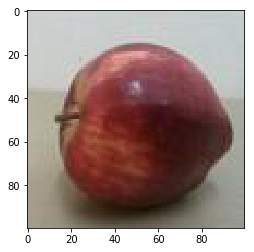

testing image============== 65
apple
I am 100.00% sure


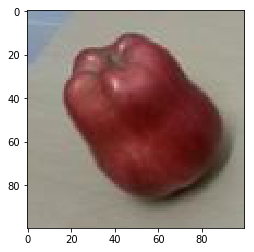

testing image============== 66
apple
I am 100.00% sure


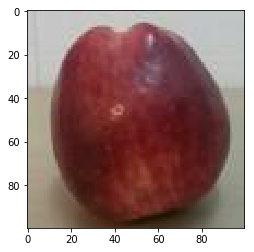

testing image============== 67
apple
I am 100.00% sure


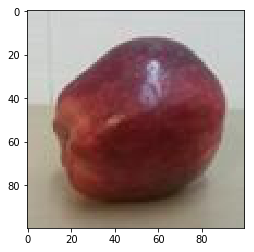

testing image============== 68
apple
I am 100.00% sure


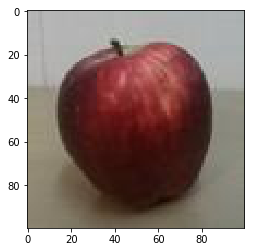

testing image============== 69
apple
I am 100.00% sure


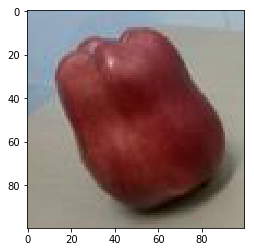

testing image============== 70
apple
I am 100.00% sure


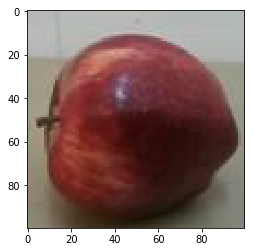

testing image============== 71
apple
I am 100.00% sure


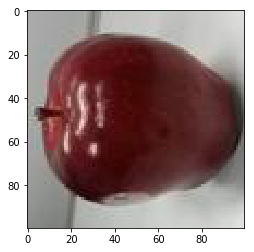

testing image============== 72
apple
I am 100.00% sure


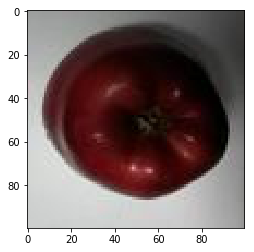

testing image============== 73
apple
I am 100.00% sure


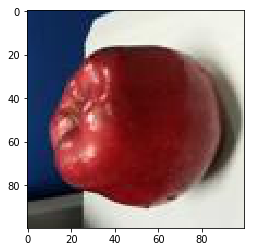

testing image============== 74
apple
I am 100.00% sure


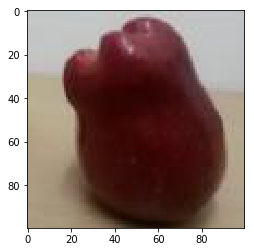

testing image============== 75
apple
I am 100.00% sure


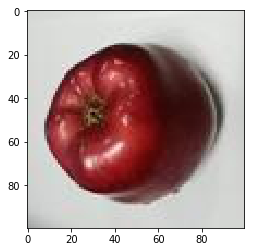

testing image============== 76
apple
I am 100.00% sure


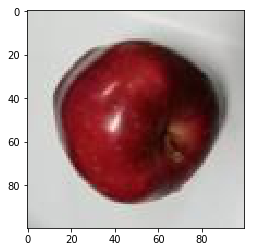

testing image============== 77
apple
I am 100.00% sure


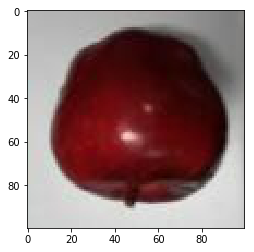

testing image============== 78
apple
I am 100.00% sure


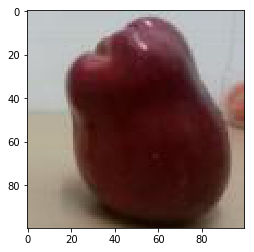

testing image============== 79
apple
I am 100.00% sure


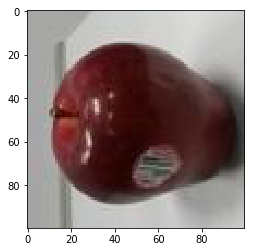

testing image============== 80
apple
I am 100.00% sure


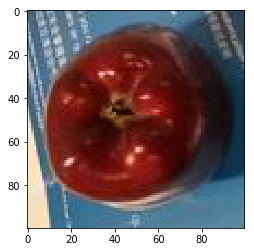

testing image============== 81
apple
I am 100.00% sure


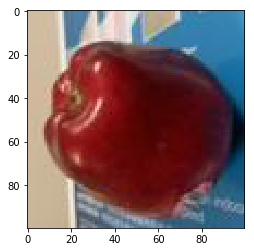

testing image============== 82
apple
I am 100.00% sure


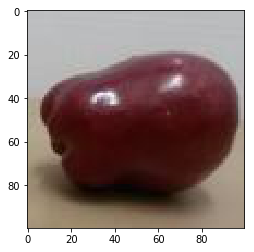

testing image============== 83
apple
I am 100.00% sure


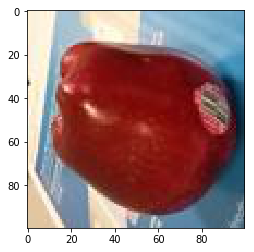

testing image============== 84
apple
I am 100.00% sure


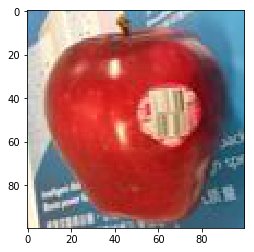

testing image============== 85
apple
I am 100.00% sure


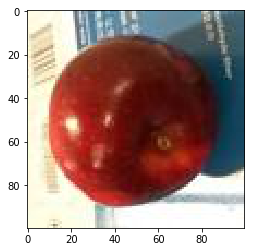

testing image============== 86
apple
I am 100.00% sure


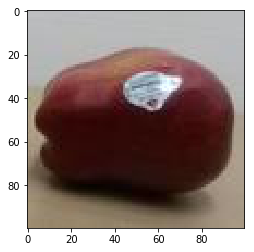

testing image============== 87
apple
I am 100.00% sure


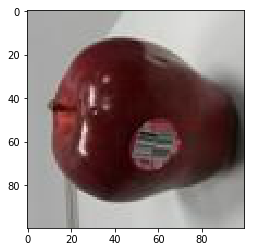

testing image============== 88
apple
I am 100.00% sure


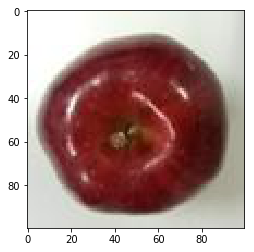

testing image============== 89
apple
I am 100.00% sure


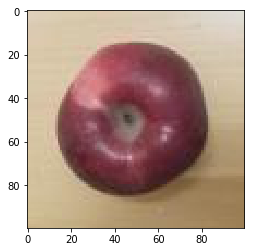

testing image============== 90
apple
I am 100.00% sure


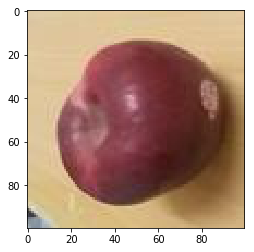

testing image============== 91
apple
I am 100.00% sure


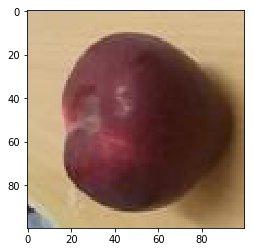

testing image============== 92
apple
I am 100.00% sure


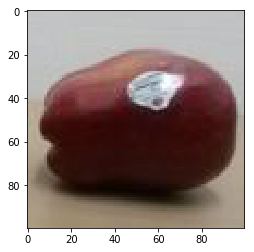

testing image============== 93
apple
I am 100.00% sure


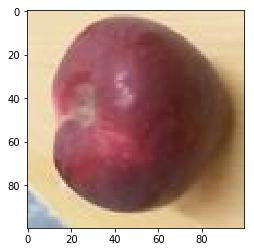

testing image============== 94
apple
I am 100.00% sure


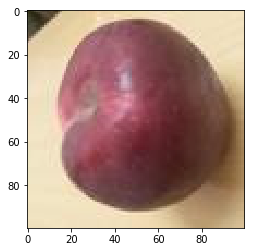

testing image============== 95
apple
I am 100.00% sure


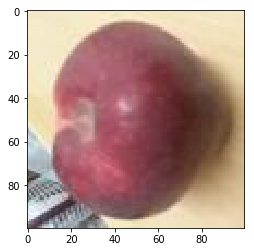

testing image============== 96
apple
I am 100.00% sure


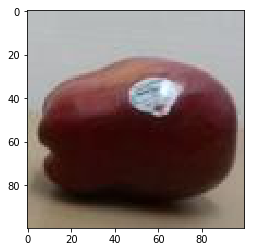

testing image============== 97
apple
I am 100.00% sure


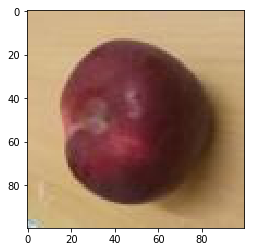

testing image============== 98
apple
I am 100.00% sure


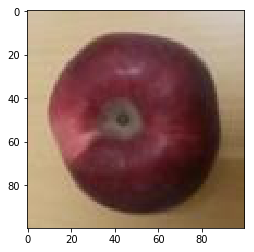

testing image============== 99
apple
I am 100.00% sure


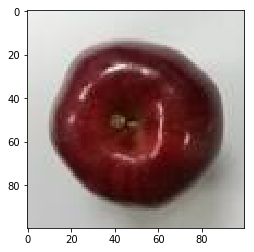

testing image============== 100
kiwi
I am 99.83% sure


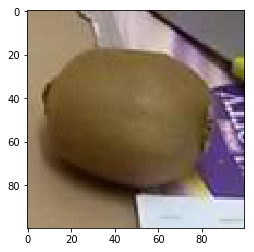

testing image============== 101
kiwi
I am 99.83% sure


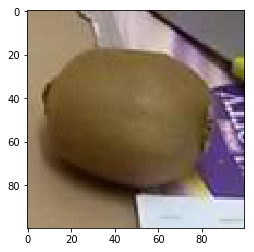

testing image============== 102
kiwi
I am 100.00% sure


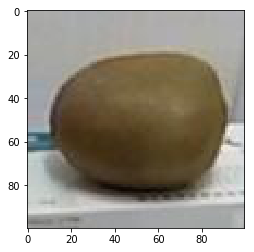

testing image============== 103
kiwi
I am 100.00% sure


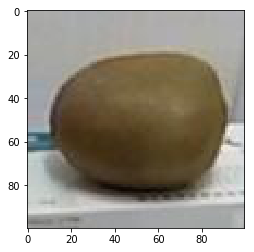

testing image============== 104
kiwi
I am 100.00% sure


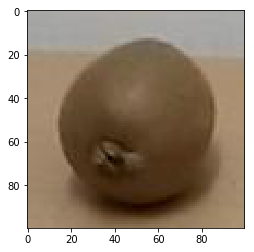

testing image============== 105
kiwi
I am 100.00% sure


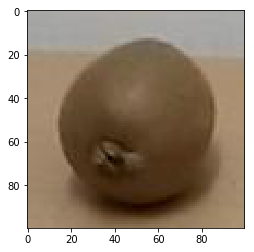

testing image============== 106
kiwi
I am 100.00% sure


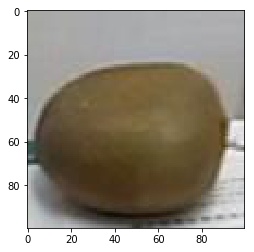

testing image============== 107
kiwi
I am 100.00% sure


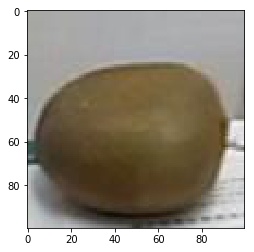

testing image============== 108
kiwi
I am 99.66% sure


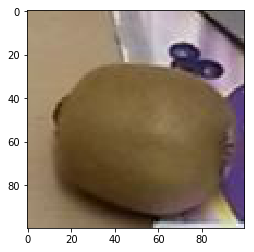

testing image============== 109
kiwi
I am 99.66% sure


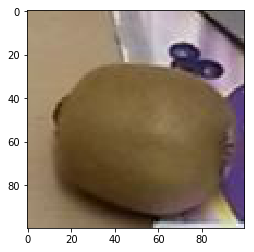

testing image============== 110
kiwi
I am 99.99% sure


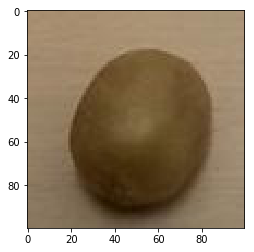

testing image============== 111
kiwi
I am 99.99% sure


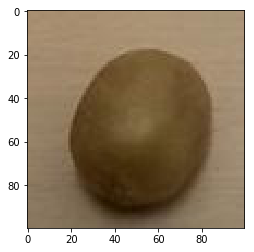

testing image============== 112
kiwi
I am 100.00% sure


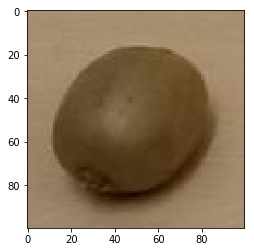

testing image============== 113
kiwi
I am 100.00% sure


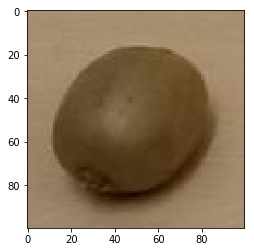

testing image============== 114
kiwi
I am 100.00% sure


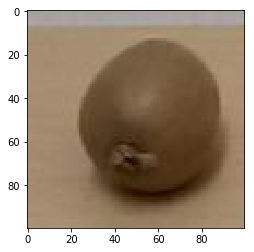

testing image============== 115
kiwi
I am 100.00% sure


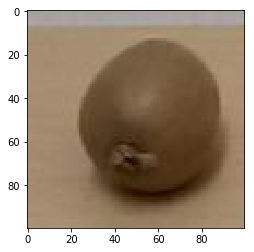

testing image============== 116
kiwi
I am 100.00% sure


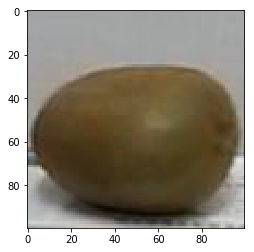

testing image============== 117
kiwi
I am 100.00% sure


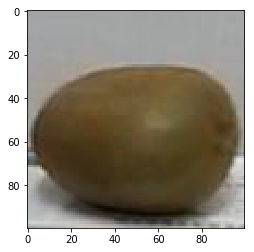

testing image============== 118
kiwi
I am 99.44% sure


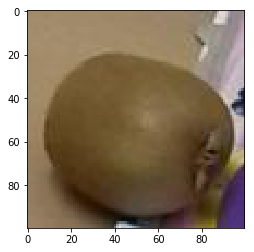

testing image============== 119
kiwi
I am 99.44% sure


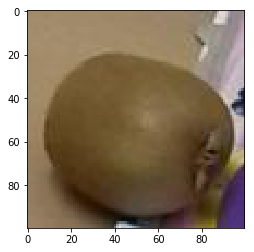

testing image============== 120
kiwi
I am 100.00% sure


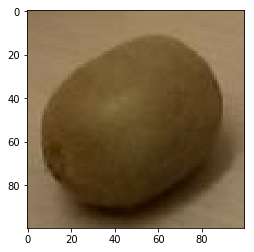

testing image============== 121
kiwi
I am 100.00% sure


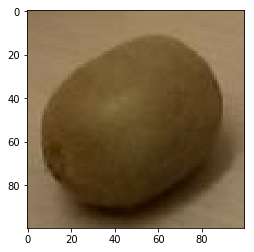

testing image============== 122
kiwi
I am 99.99% sure


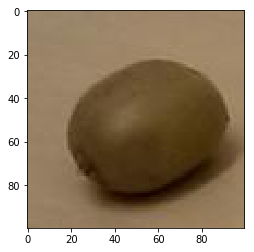

testing image============== 123
kiwi
I am 99.99% sure


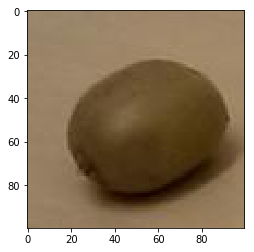

testing image============== 124
kiwi
I am 99.98% sure


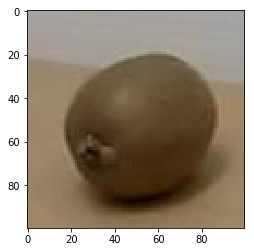

testing image============== 125
kiwi
I am 99.98% sure


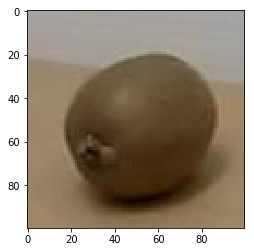

testing image============== 126
kiwi
I am 100.00% sure


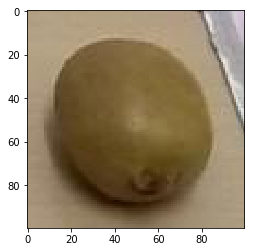

testing image============== 127
kiwi
I am 100.00% sure


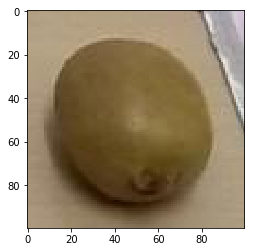

testing image============== 128
kiwi
I am 100.00% sure


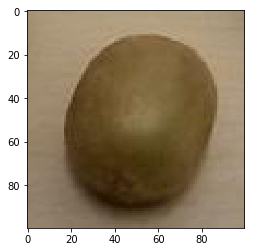

testing image============== 129
kiwi
I am 100.00% sure


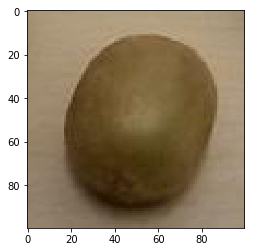

testing image============== 130
kiwi
I am 100.00% sure


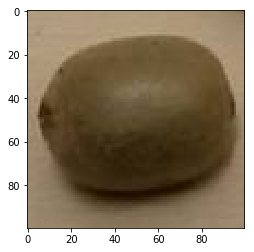

testing image============== 131
kiwi
I am 100.00% sure


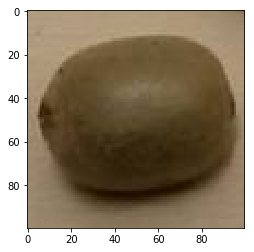

testing image============== 132
kiwi
I am 100.00% sure


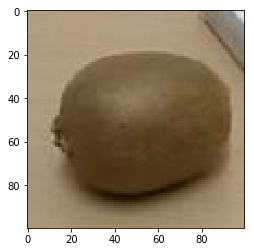

testing image============== 133
kiwi
I am 100.00% sure


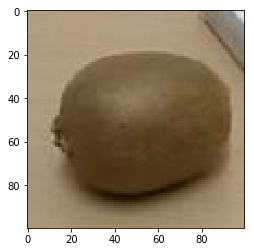

testing image============== 134
kiwi
I am 100.00% sure


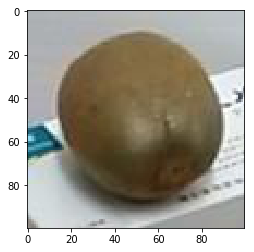

testing image============== 135
kiwi
I am 100.00% sure


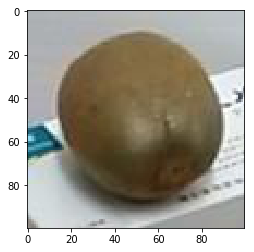

testing image============== 136
kiwi
I am 100.00% sure


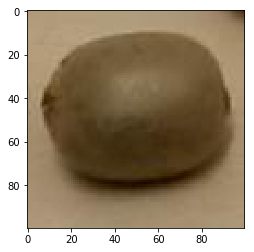

testing image============== 137
kiwi
I am 100.00% sure


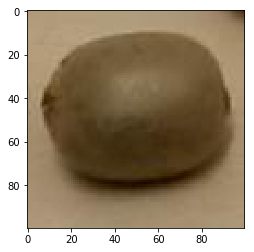

testing image============== 138
kiwi
I am 100.00% sure


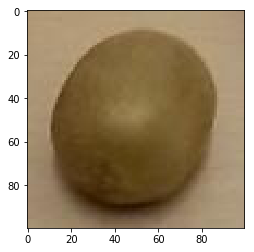

testing image============== 139
kiwi
I am 100.00% sure


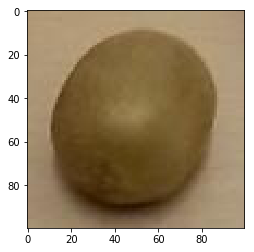

testing image============== 140
kiwi
I am 100.00% sure


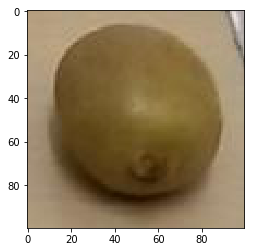

testing image============== 141
kiwi
I am 100.00% sure


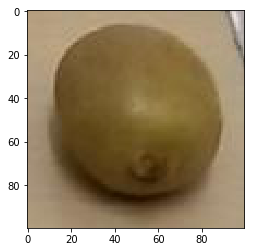

testing image============== 142
kiwi
I am 100.00% sure


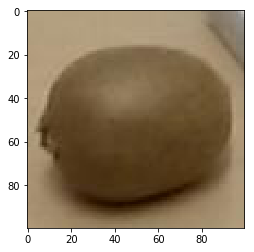

testing image============== 143
kiwi
I am 100.00% sure


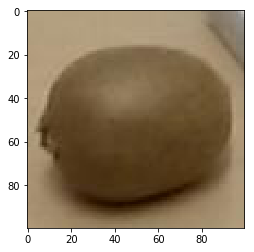

testing image============== 144
kiwi
I am 100.00% sure


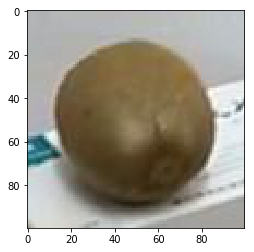

testing image============== 145
kiwi
I am 100.00% sure


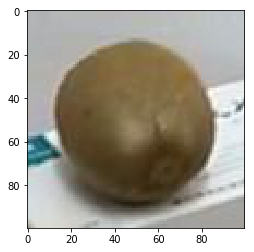

testing image============== 146
kiwi
I am 100.00% sure


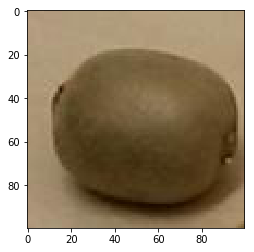

testing image============== 147
kiwi
I am 100.00% sure


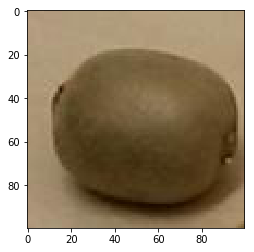

testing image============== 148
kiwi
I am 100.00% sure


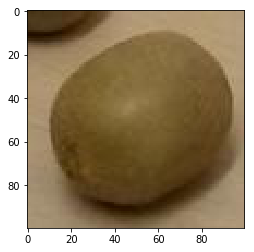

testing image============== 149
kiwi
I am 100.00% sure


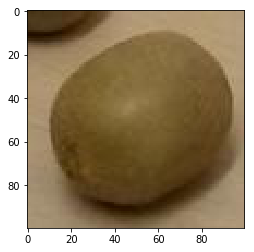

testing image============== 150
kiwi
I am 100.00% sure


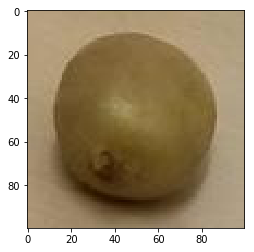

testing image============== 151
kiwi
I am 100.00% sure


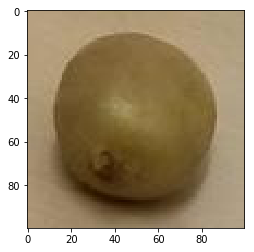

testing image============== 152
kiwi
I am 100.00% sure


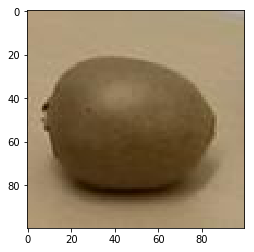

testing image============== 153
kiwi
I am 100.00% sure


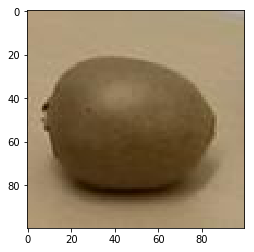

testing image============== 154
kiwi
I am 100.00% sure


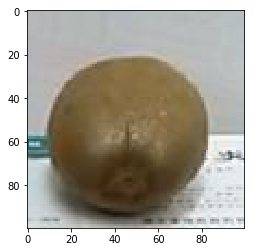

testing image============== 155
kiwi
I am 100.00% sure


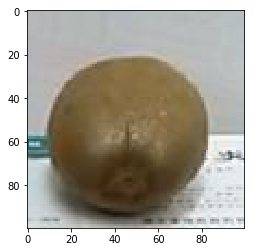

testing image============== 156
kiwi
I am 100.00% sure


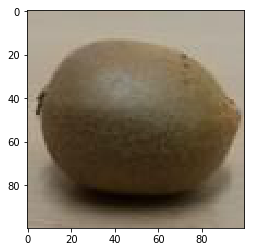

testing image============== 157
kiwi
I am 100.00% sure


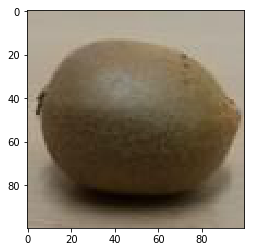

testing image============== 158
kiwi
I am 100.00% sure


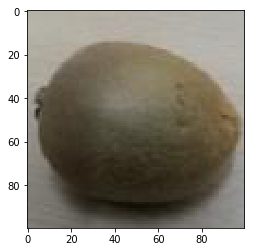

testing image============== 159
kiwi
I am 100.00% sure


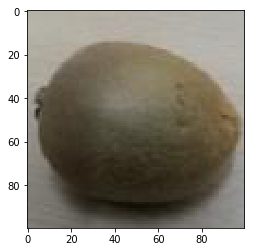

testing image============== 160
kiwi
I am 100.00% sure


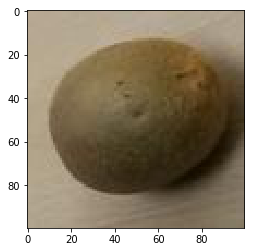

testing image============== 161
kiwi
I am 100.00% sure


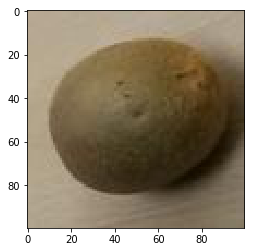

testing image============== 162
kiwi
I am 100.00% sure


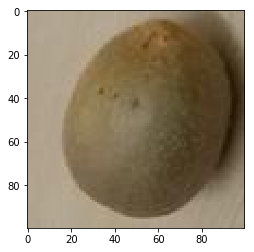

testing image============== 163
kiwi
I am 100.00% sure


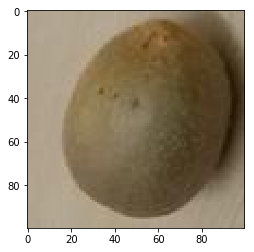

testing image============== 164
kiwi
I am 100.00% sure


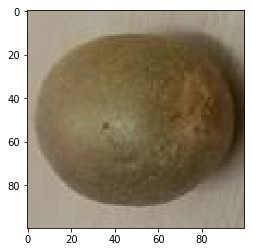

testing image============== 165
kiwi
I am 100.00% sure


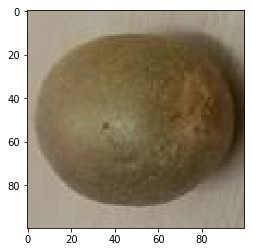

testing image============== 166
kiwi
I am 100.00% sure


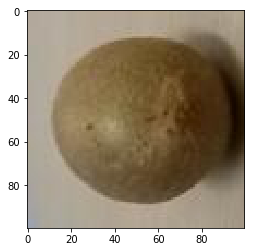

testing image============== 167
kiwi
I am 100.00% sure


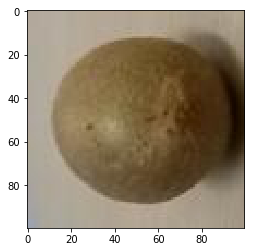

testing image============== 168
kiwi
I am 100.00% sure


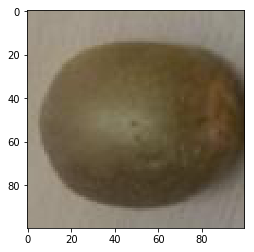

testing image============== 169
kiwi
I am 100.00% sure


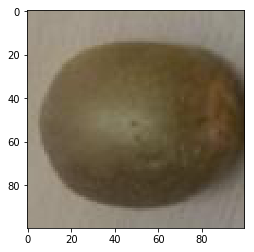

testing image============== 170
kiwi
I am 100.00% sure


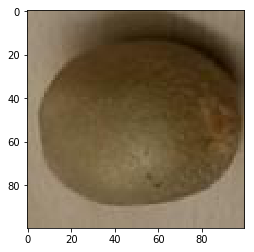

testing image============== 171
kiwi
I am 100.00% sure


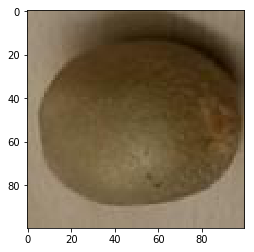

testing image============== 172
kiwi
I am 100.00% sure


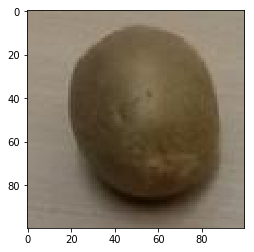

testing image============== 173
kiwi
I am 100.00% sure


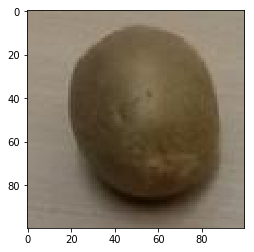

testing image============== 174
kiwi
I am 100.00% sure


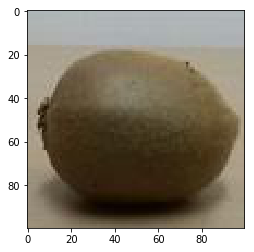

testing image============== 175
kiwi
I am 100.00% sure


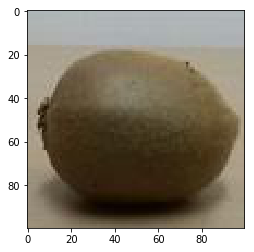

testing image============== 176
kiwi
I am 100.00% sure


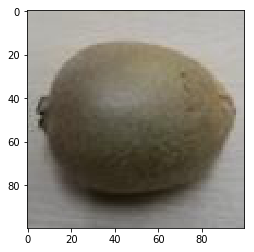

testing image============== 177
kiwi
I am 100.00% sure


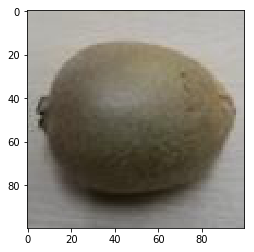

testing image============== 178
kiwi
I am 100.00% sure


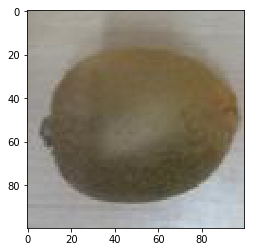

testing image============== 179
kiwi
I am 100.00% sure


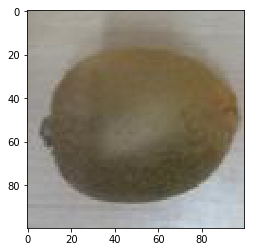

testing image============== 180
kiwi
I am 100.00% sure


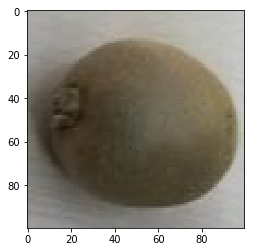

testing image============== 181
kiwi
I am 100.00% sure


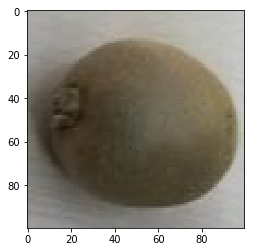

testing image============== 182
kiwi
I am 100.00% sure


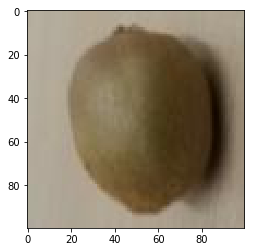

testing image============== 183
kiwi
I am 100.00% sure


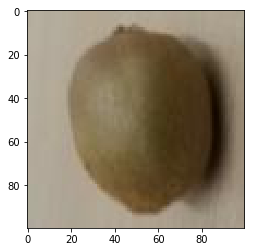

testing image============== 184
kiwi
I am 100.00% sure


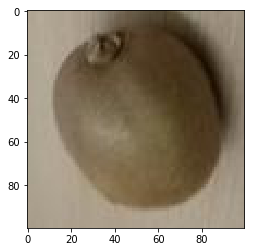

testing image============== 185
kiwi
I am 100.00% sure


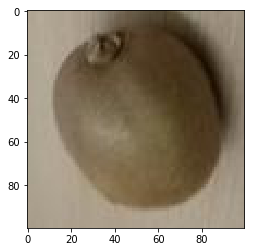

testing image============== 186
kiwi
I am 100.00% sure


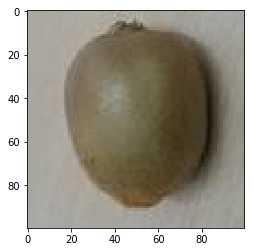

testing image============== 187
kiwi
I am 100.00% sure


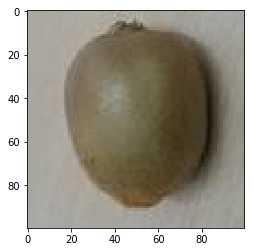

testing image============== 188
kiwi
I am 100.00% sure


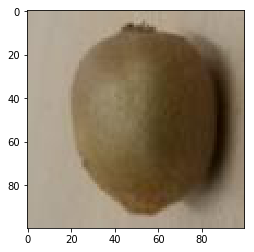

testing image============== 189
kiwi
I am 100.00% sure


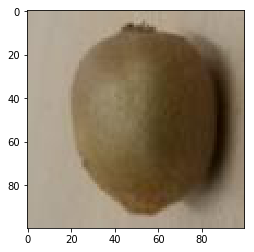

testing image============== 190
kiwi
I am 100.00% sure


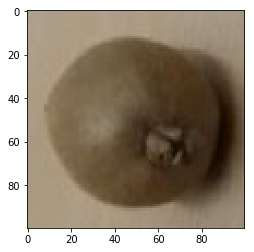

testing image============== 191
kiwi
I am 100.00% sure


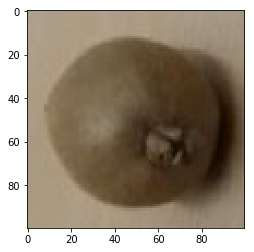

testing image============== 192
kiwi
I am 100.00% sure


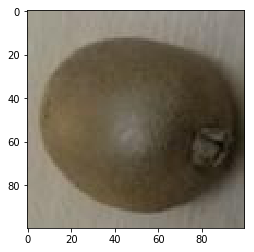

testing image============== 193
kiwi
I am 100.00% sure


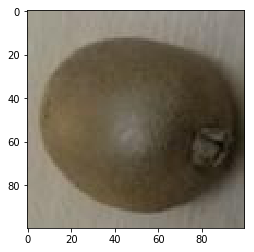

testing image============== 194
kiwi
I am 100.00% sure


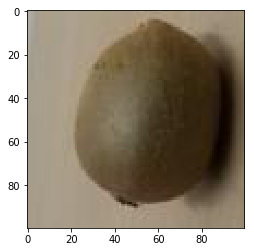

testing image============== 195
kiwi
I am 100.00% sure


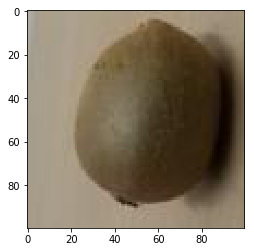

testing image============== 196
kiwi
I am 100.00% sure


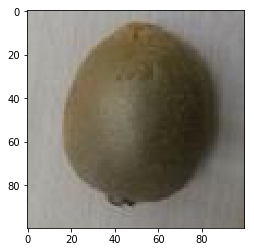

testing image============== 197
kiwi
I am 100.00% sure


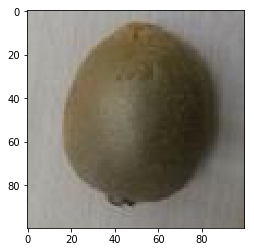

testing image============== 198
kiwi
I am 99.98% sure


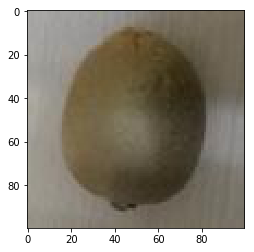

testing image============== 199
kiwi
I am 99.98% sure


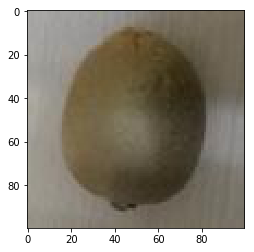

testing image============== 200
orange
I am 100.00% sure


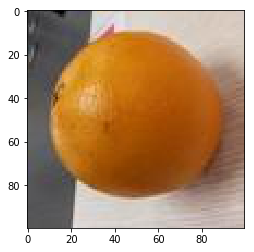

testing image============== 201
orange
I am 100.00% sure


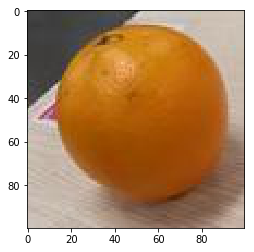

testing image============== 202
orange
I am 100.00% sure


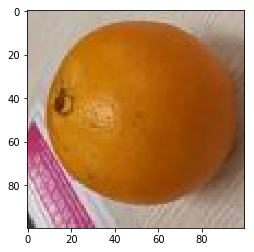

testing image============== 203
orange
I am 100.00% sure


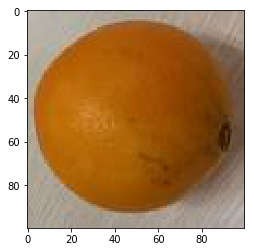

testing image============== 204
orange
I am 100.00% sure


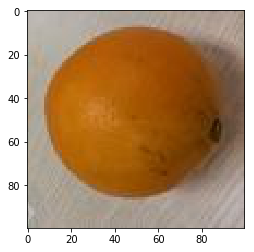

testing image============== 205
orange
I am 100.00% sure


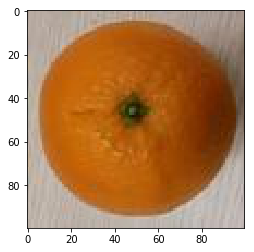

testing image============== 206
orange
I am 100.00% sure


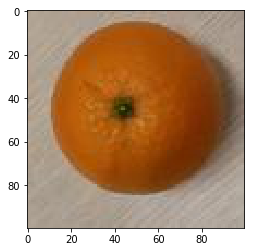

testing image============== 207
orange
I am 100.00% sure


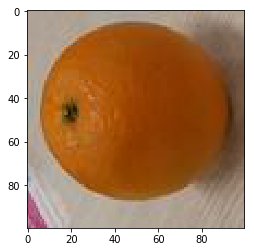

testing image============== 208
orange
I am 100.00% sure


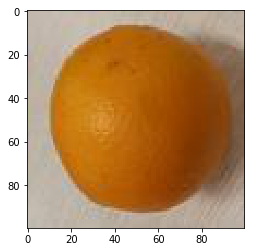

testing image============== 209
orange
I am 100.00% sure


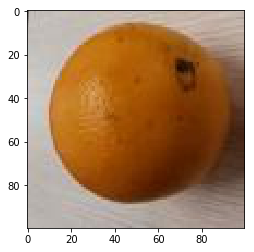

testing image============== 210
orange
I am 100.00% sure


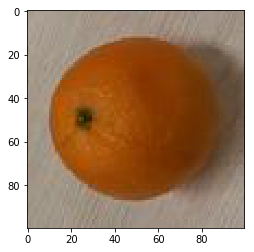

testing image============== 211
orange
I am 100.00% sure


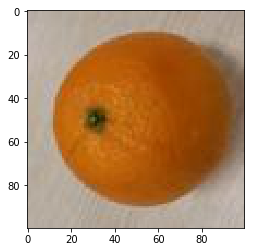

testing image============== 212
orange
I am 100.00% sure


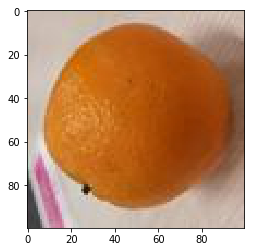

testing image============== 213
orange
I am 100.00% sure


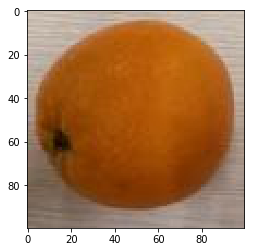

testing image============== 214
orange
I am 100.00% sure


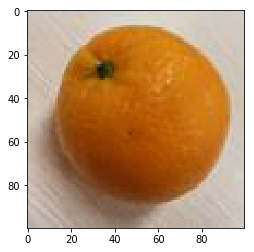

testing image============== 215
orange
I am 100.00% sure


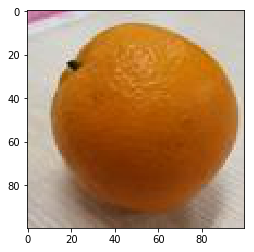

testing image============== 216
orange
I am 100.00% sure


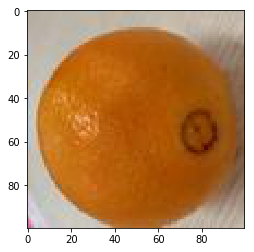

testing image============== 217
orange
I am 100.00% sure


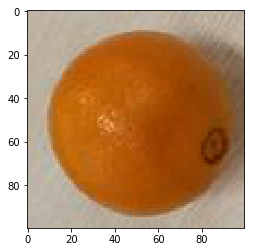

testing image============== 218
orange
I am 100.00% sure


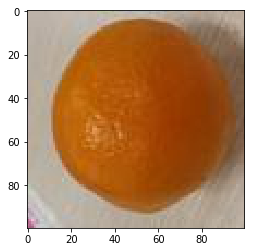

testing image============== 219
orange
I am 100.00% sure


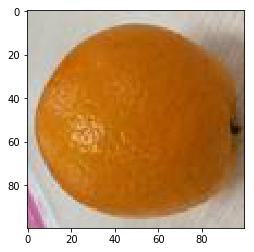

testing image============== 220
orange
I am 100.00% sure


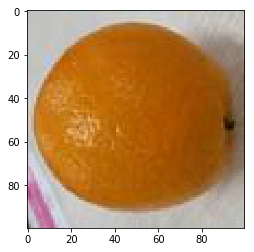

testing image============== 221
orange
I am 100.00% sure


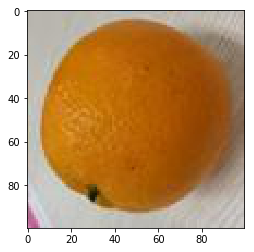

testing image============== 222
orange
I am 100.00% sure


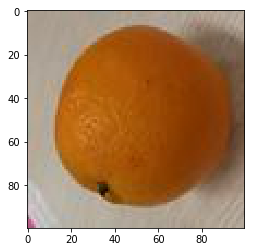

testing image============== 223
orange
I am 100.00% sure


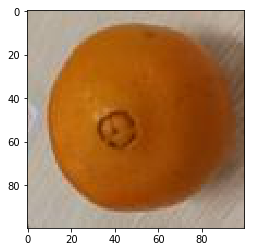

testing image============== 224
orange
I am 100.00% sure


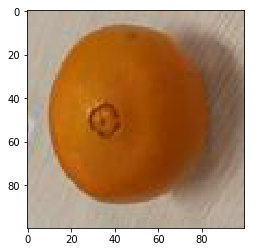

testing image============== 225
orange
I am 100.00% sure


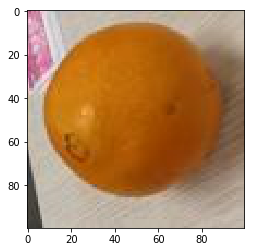

testing image============== 226
orange
I am 100.00% sure


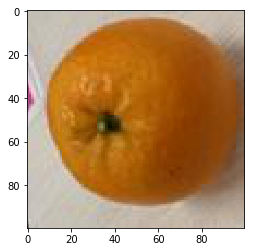

testing image============== 227
orange
I am 100.00% sure


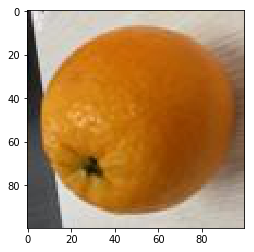

testing image============== 228
orange
I am 100.00% sure


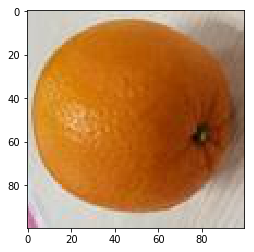

testing image============== 229
orange
I am 100.00% sure


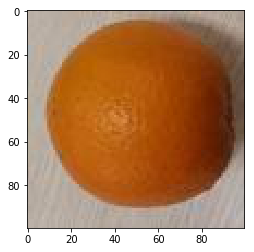

testing image============== 230
orange
I am 100.00% sure


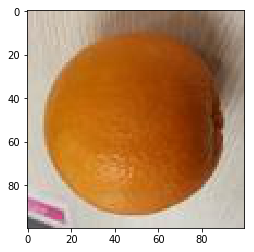

testing image============== 231
orange
I am 100.00% sure


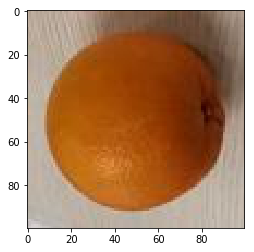

testing image============== 232
orange
I am 100.00% sure


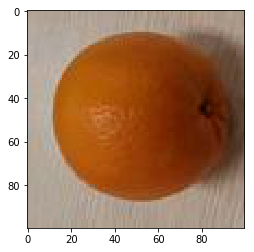

testing image============== 233
orange
I am 100.00% sure


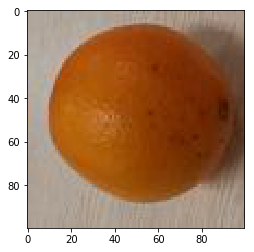

testing image============== 234
orange
I am 100.00% sure


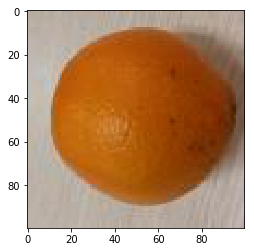

testing image============== 235
orange
I am 100.00% sure


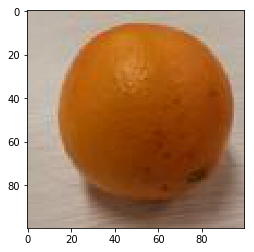

testing image============== 236
orange
I am 100.00% sure


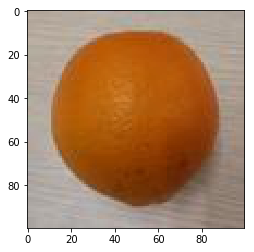

testing image============== 237
orange
I am 100.00% sure


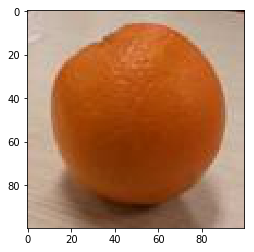

testing image============== 238
orange
I am 100.00% sure


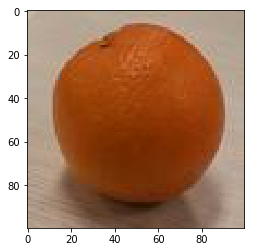

testing image============== 239
orange
I am 100.00% sure


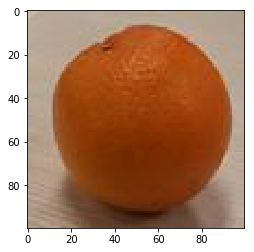

testing image============== 240
orange
I am 100.00% sure


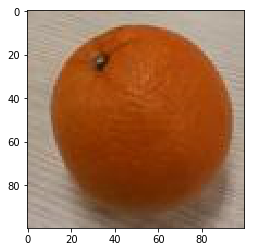

testing image============== 241
orange
I am 100.00% sure


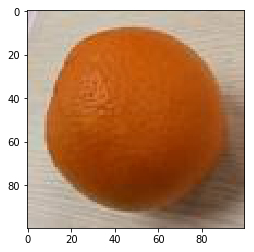

testing image============== 242
orange
I am 100.00% sure


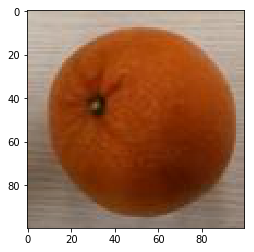

testing image============== 243
orange
I am 100.00% sure


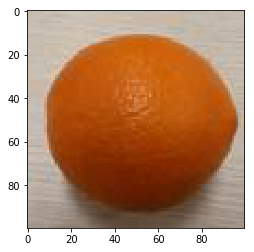

testing image============== 244
orange
I am 100.00% sure


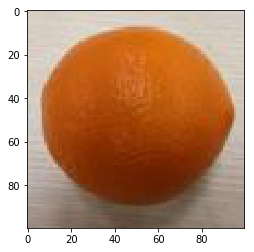

testing image============== 245
orange
I am 100.00% sure


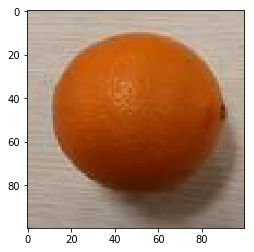

testing image============== 246
orange
I am 100.00% sure


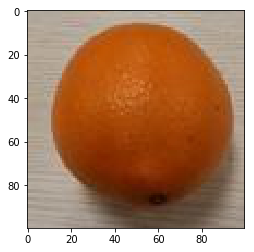

testing image============== 247
orange
I am 100.00% sure


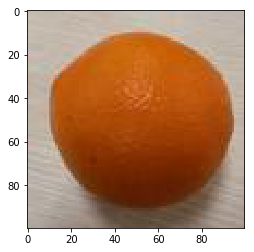

testing image============== 248
orange
I am 100.00% sure


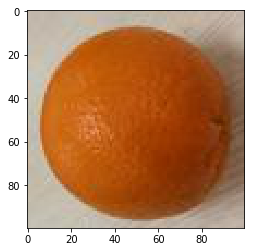

testing image============== 249
orange
I am 100.00% sure


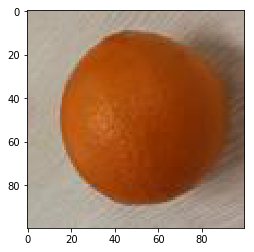

testing image============== 250
orange
I am 100.00% sure


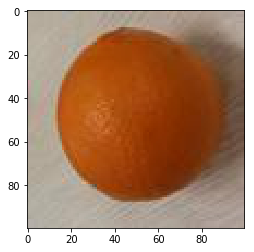

testing image============== 251
orange
I am 100.00% sure


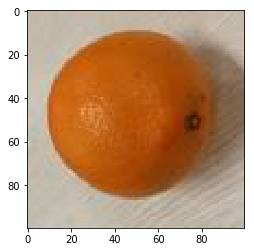

testing image============== 252
orange
I am 100.00% sure


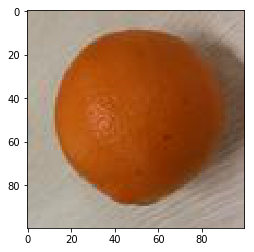

testing image============== 253
orange
I am 100.00% sure


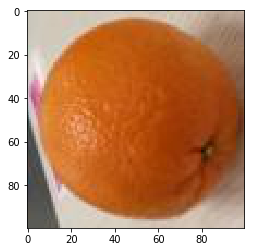

testing image============== 254
orange
I am 100.00% sure


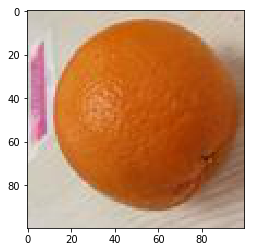

testing image============== 255
orange
I am 99.98% sure


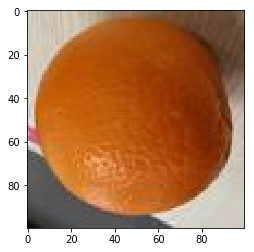

testing image============== 256
orange
I am 100.00% sure


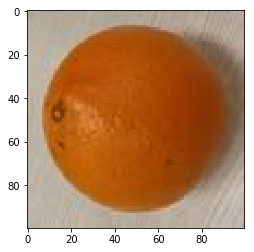

testing image============== 257
orange
I am 100.00% sure


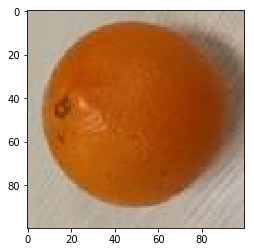

testing image============== 258
orange
I am 100.00% sure


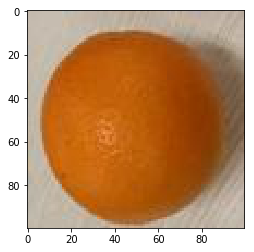

testing image============== 259
orange
I am 100.00% sure


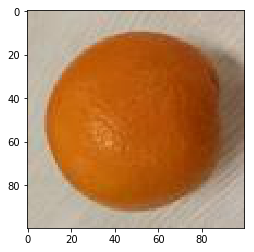

testing image============== 260
orange
I am 100.00% sure


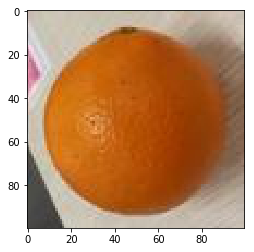

testing image============== 261
orange
I am 100.00% sure


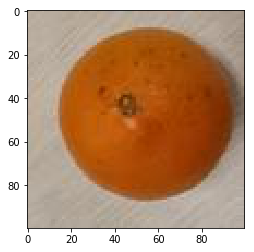

testing image============== 262
orange
I am 100.00% sure


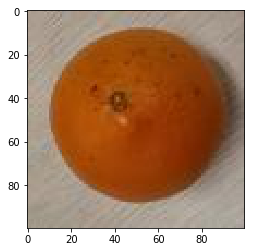

testing image============== 263
orange
I am 100.00% sure


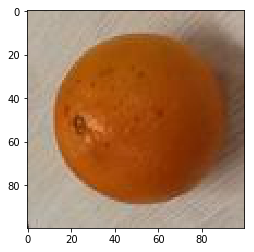

testing image============== 264
orange
I am 100.00% sure


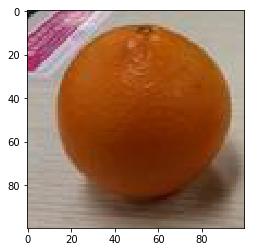

testing image============== 265
orange
I am 100.00% sure


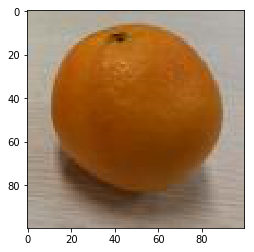

testing image============== 266
orange
I am 100.00% sure


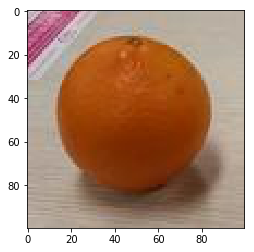

testing image============== 267
orange
I am 100.00% sure


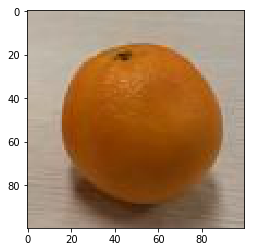

testing image============== 268
orange
I am 100.00% sure


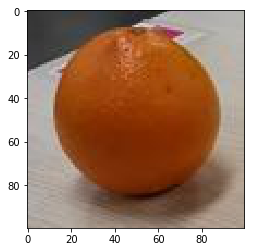

testing image============== 269
orange
I am 100.00% sure


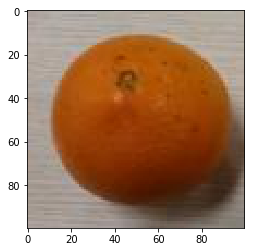

testing image============== 270
orange
I am 100.00% sure


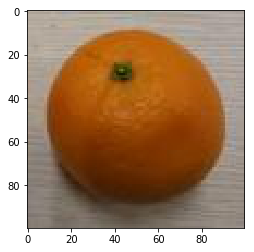

testing image============== 271
orange
I am 100.00% sure


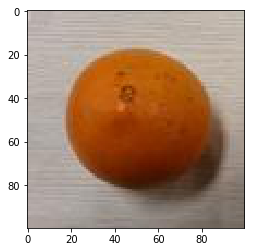

testing image============== 272
orange
I am 100.00% sure


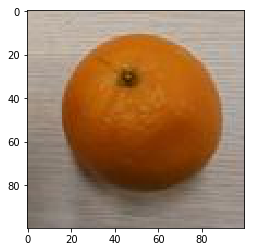

testing image============== 273
orange
I am 100.00% sure


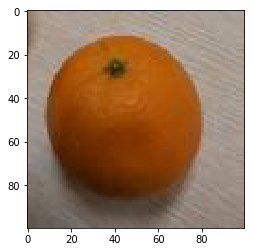

testing image============== 274
orange
I am 100.00% sure


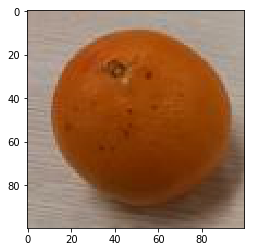

testing image============== 275
orange
I am 100.00% sure


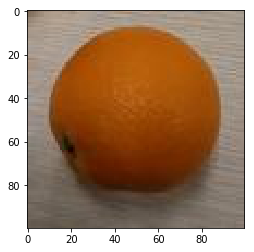

testing image============== 276
orange
I am 100.00% sure


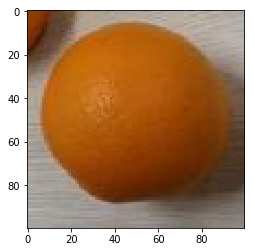

testing image============== 277
orange
I am 100.00% sure


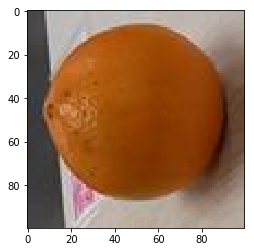

testing image============== 278
orange
I am 100.00% sure


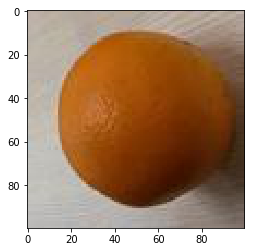

testing image============== 279
orange
I am 100.00% sure


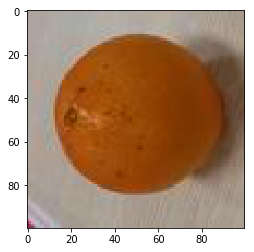

testing image============== 280
orange
I am 100.00% sure


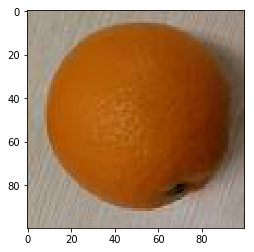

testing image============== 281
orange
I am 100.00% sure


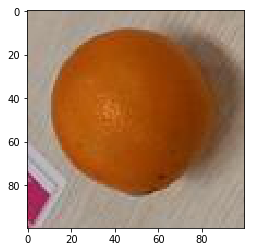

testing image============== 282
orange
I am 100.00% sure


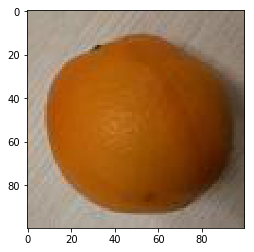

testing image============== 283
orange
I am 100.00% sure


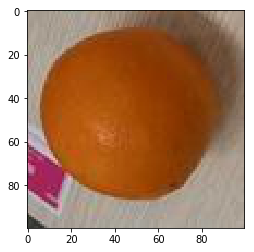

testing image============== 284
orange
I am 100.00% sure


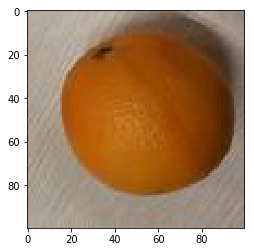

testing image============== 285
orange
I am 100.00% sure


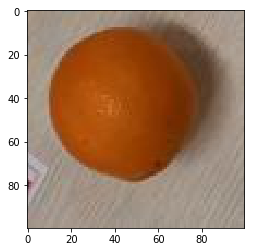

testing image============== 286
orange
I am 100.00% sure


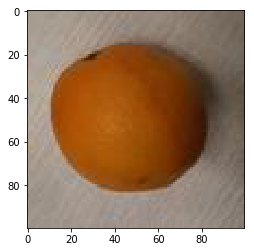

testing image============== 287
orange
I am 100.00% sure


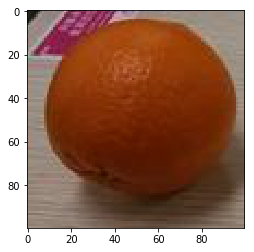

testing image============== 288
orange
I am 100.00% sure


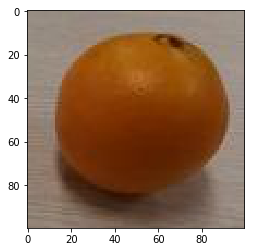

testing image============== 289
orange
I am 100.00% sure


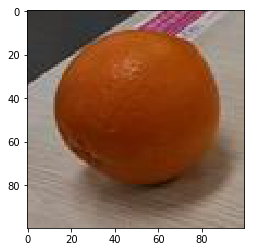

testing image============== 290
orange
I am 100.00% sure


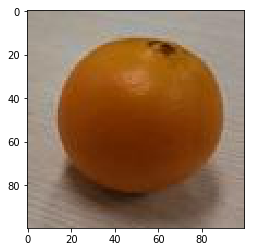

testing image============== 291
orange
I am 100.00% sure


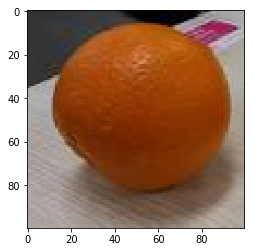

testing image============== 292
orange
I am 100.00% sure


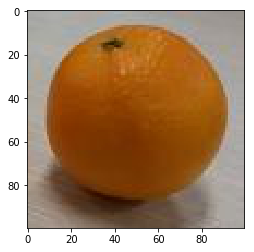

testing image============== 293
orange
I am 100.00% sure


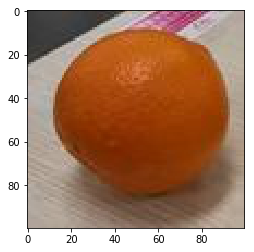

testing image============== 294
orange
I am 100.00% sure


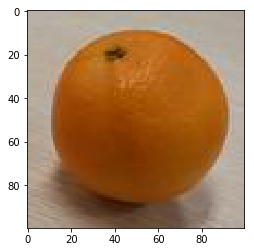

testing image============== 295
orange
I am 100.00% sure


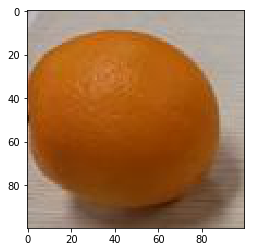

testing image============== 296
orange
I am 100.00% sure


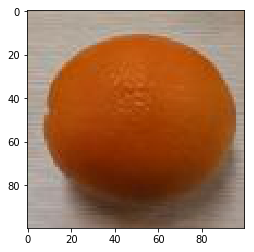

testing image============== 297
orange
I am 100.00% sure


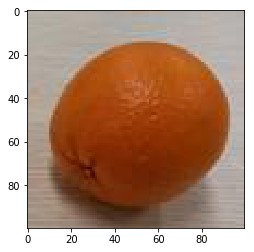

testing image============== 298
orange
I am 100.00% sure


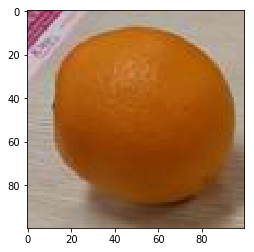

testing image============== 299
orange
I am 100.00% sure


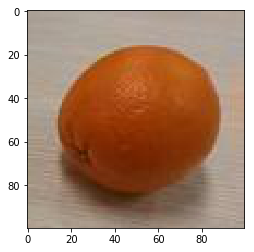

testing image============== 300
pear
I am 100.00% sure


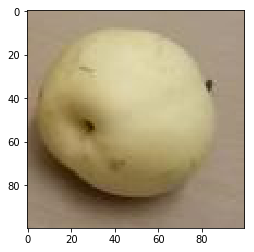

testing image============== 301
pear
I am 100.00% sure


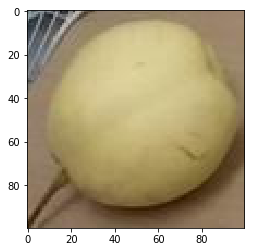

testing image============== 302
pear
I am 100.00% sure


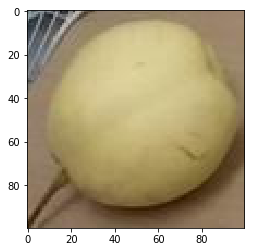

testing image============== 303
pear
I am 100.00% sure


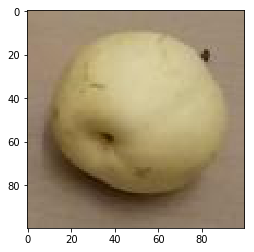

testing image============== 304
pear
I am 100.00% sure


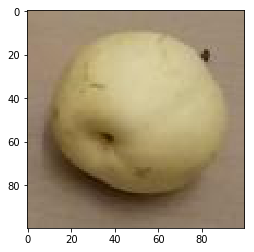

testing image============== 305
pear
I am 100.00% sure


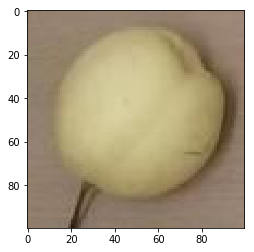

testing image============== 306
pear
I am 100.00% sure


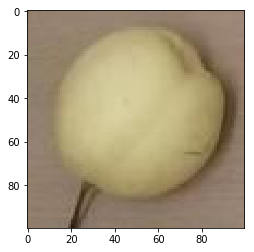

testing image============== 307
pear
I am 100.00% sure


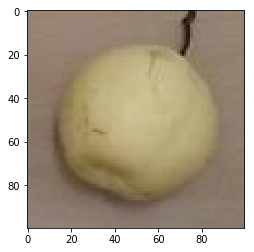

testing image============== 308
pear
I am 100.00% sure


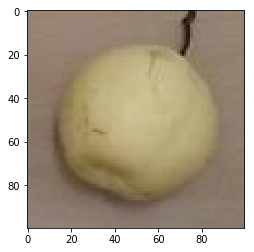

testing image============== 309
pear
I am 100.00% sure


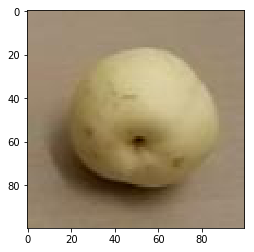

testing image============== 310
pear
I am 100.00% sure


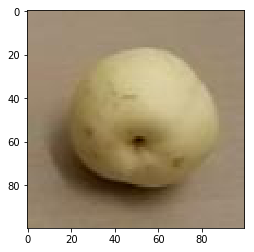

testing image============== 311
pear
I am 100.00% sure


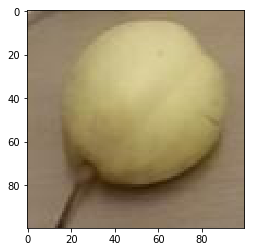

testing image============== 312
pear
I am 100.00% sure


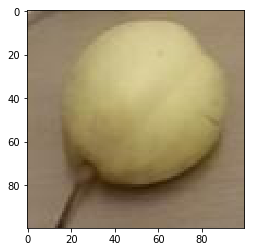

testing image============== 313
pear
I am 100.00% sure


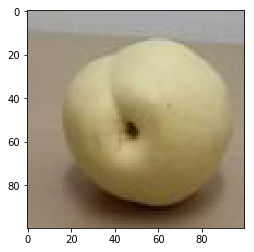

testing image============== 314
pear
I am 100.00% sure


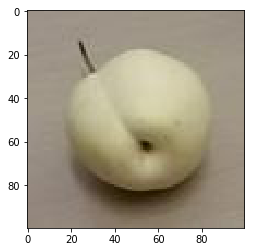

testing image============== 315
pear
I am 100.00% sure


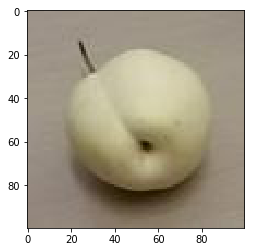

testing image============== 316
pear
I am 100.00% sure


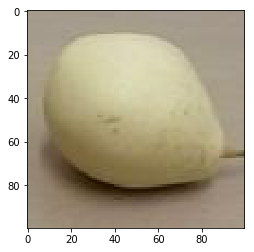

testing image============== 317
pear
I am 100.00% sure


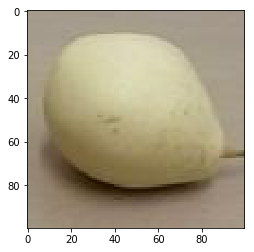

testing image============== 318
pear
I am 100.00% sure


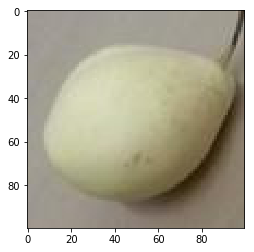

testing image============== 319
pear
I am 100.00% sure


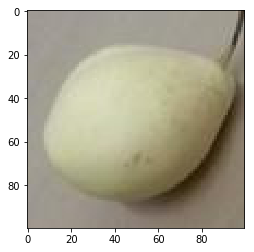

testing image============== 320
pear
I am 100.00% sure


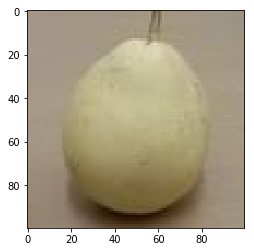

testing image============== 321
pear
I am 100.00% sure


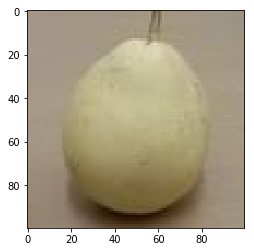

testing image============== 322
pear
I am 100.00% sure


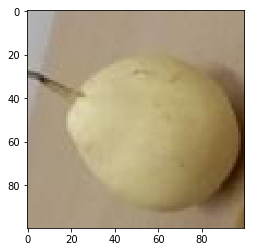

testing image============== 323
pear
I am 100.00% sure


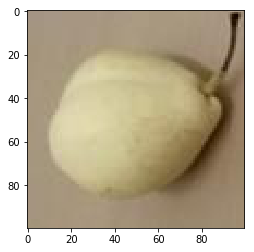

testing image============== 324
pear
I am 100.00% sure


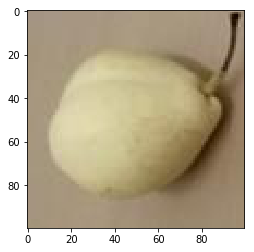

testing image============== 325
pear
I am 100.00% sure


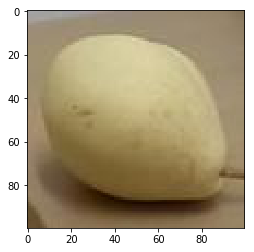

testing image============== 326
pear
I am 100.00% sure


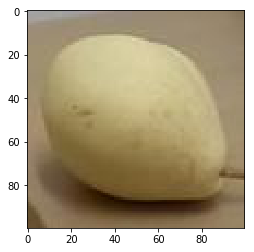

testing image============== 327
pear
I am 100.00% sure


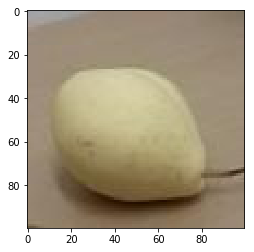

testing image============== 328
pear
I am 100.00% sure


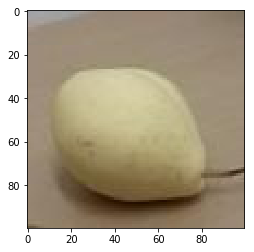

testing image============== 329
pear
I am 100.00% sure


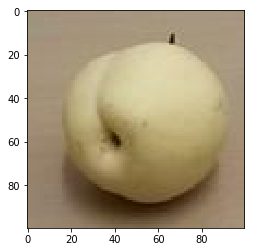

testing image============== 330
pear
I am 100.00% sure


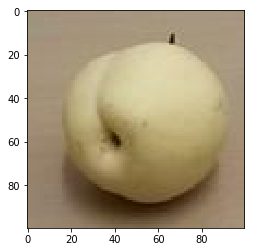

testing image============== 331
pear
I am 100.00% sure


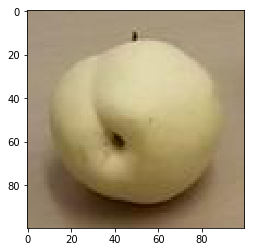

testing image============== 332
pear
I am 100.00% sure


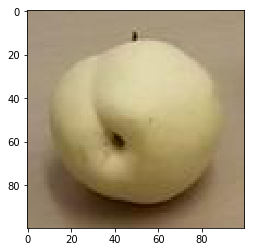

testing image============== 333
pear
I am 100.00% sure


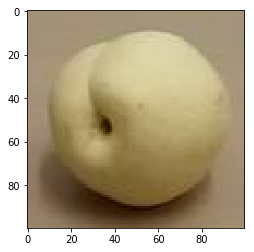

testing image============== 334
pear
I am 100.00% sure


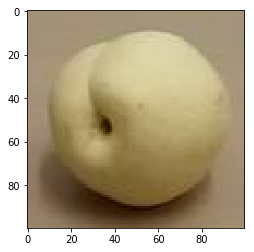

testing image============== 335
pear
I am 100.00% sure


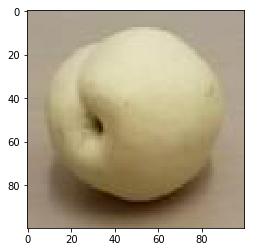

testing image============== 336
pear
I am 100.00% sure


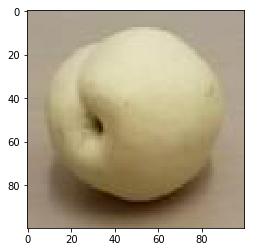

testing image============== 337
pear
I am 100.00% sure


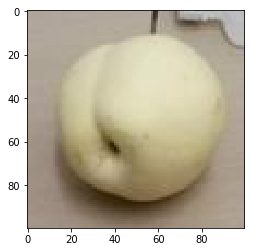

testing image============== 338
pear
I am 100.00% sure


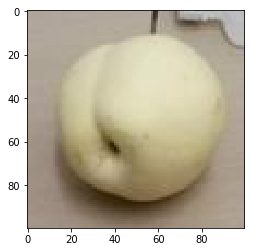

testing image============== 339
pear
I am 100.00% sure


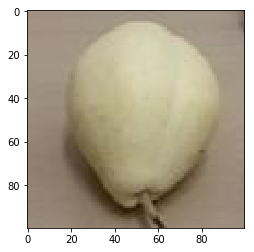

testing image============== 340
pear
I am 100.00% sure


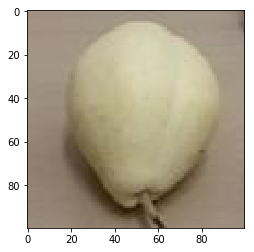

testing image============== 341
pear
I am 100.00% sure


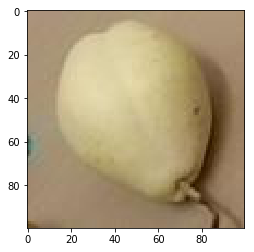

testing image============== 342
pear
I am 100.00% sure


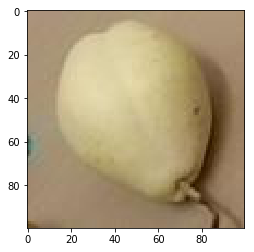

testing image============== 343
pear
I am 100.00% sure


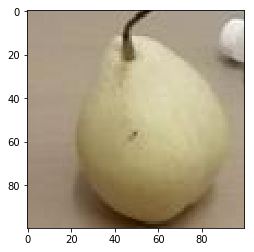

testing image============== 344
pear
I am 100.00% sure


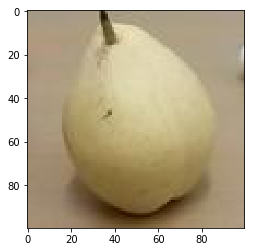

testing image============== 345
pear
I am 100.00% sure


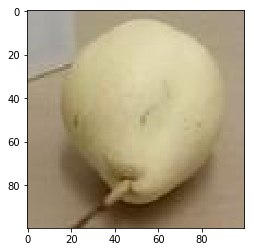

testing image============== 346
pear
I am 100.00% sure


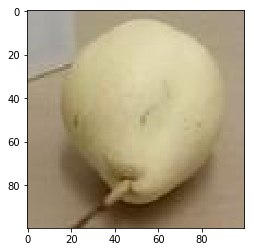

testing image============== 347
pear
I am 100.00% sure


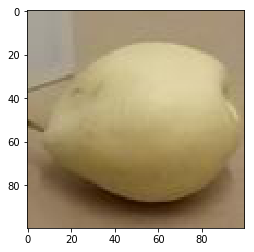

testing image============== 348
pear
I am 100.00% sure


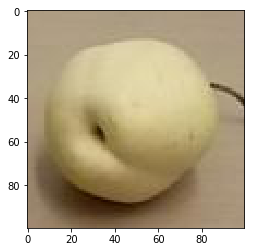

testing image============== 349
pear
I am 100.00% sure


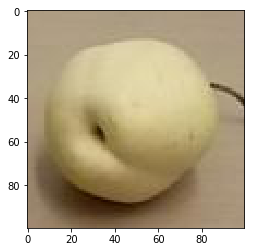

testing image============== 350
pear
I am 100.00% sure


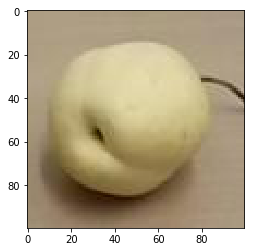

testing image============== 351
pear
I am 100.00% sure


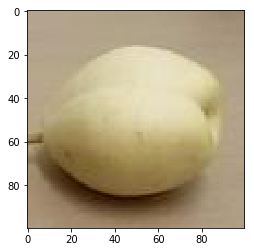

testing image============== 352
pear
I am 100.00% sure


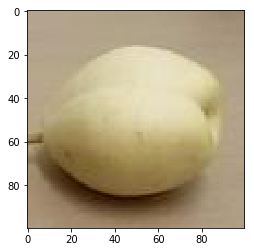

testing image============== 353
pear
I am 100.00% sure


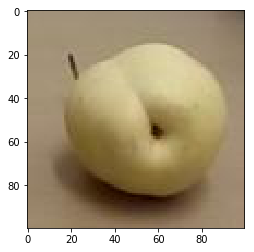

testing image============== 354
pear
I am 100.00% sure


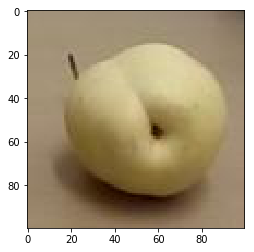

testing image============== 355
pear
I am 100.00% sure


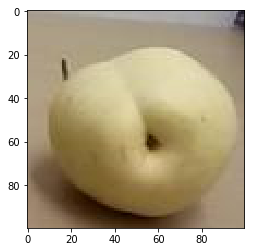

testing image============== 356
pear
I am 100.00% sure


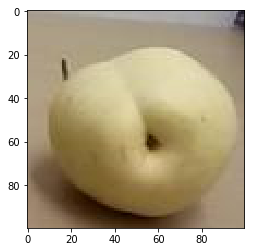

testing image============== 357
pear
I am 100.00% sure


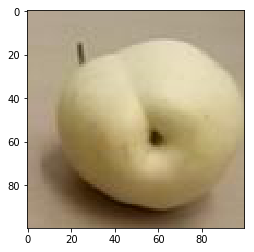

testing image============== 358
pear
I am 100.00% sure


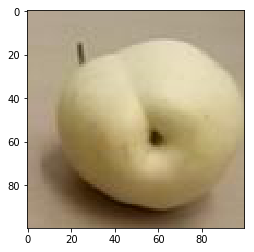

testing image============== 359
pear
I am 100.00% sure


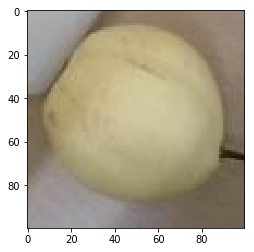

testing image============== 360
pear
I am 100.00% sure


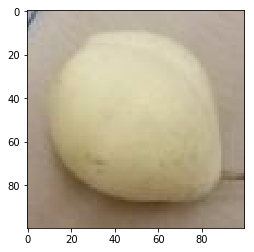

testing image============== 361
pear
I am 100.00% sure


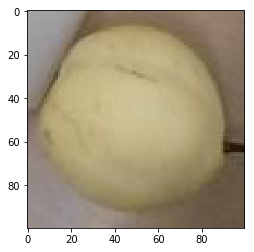

testing image============== 362
pear
I am 100.00% sure


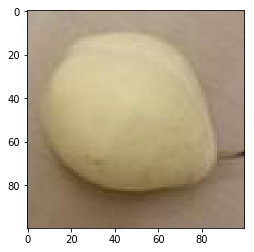

testing image============== 363
pear
I am 100.00% sure


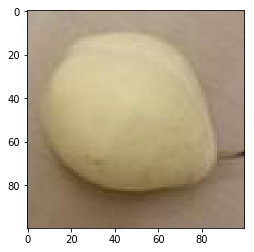

testing image============== 364
pear
I am 100.00% sure


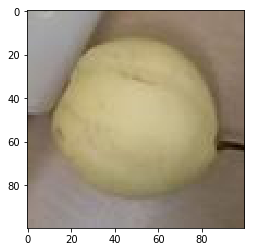

testing image============== 365
pear
I am 100.00% sure


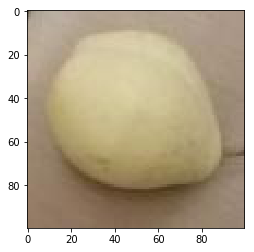

testing image============== 366
pear
I am 100.00% sure


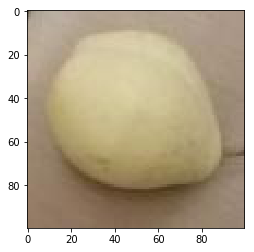

testing image============== 367
pear
I am 100.00% sure


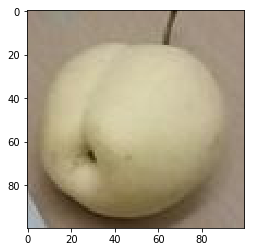

testing image============== 368
pear
I am 100.00% sure


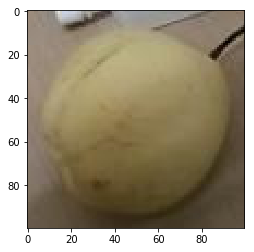

testing image============== 369
pear
I am 100.00% sure


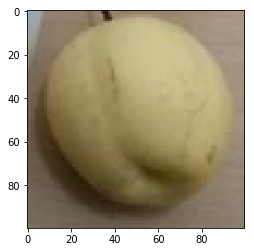

testing image============== 370
pear
I am 100.00% sure


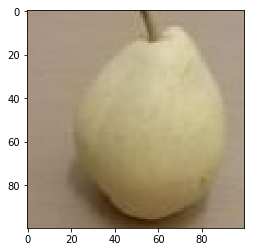

testing image============== 371
pear
I am 100.00% sure


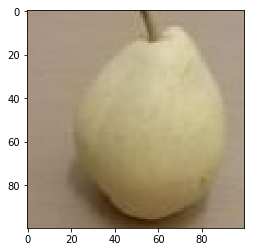

testing image============== 372
pear
I am 100.00% sure


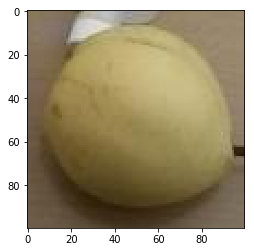

testing image============== 373
pear
I am 100.00% sure


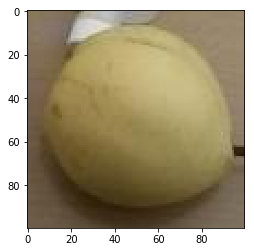

testing image============== 374
pear
I am 100.00% sure


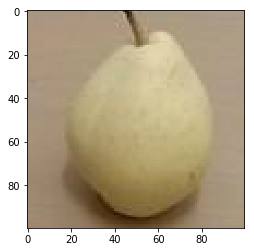

testing image============== 375
pear
I am 100.00% sure


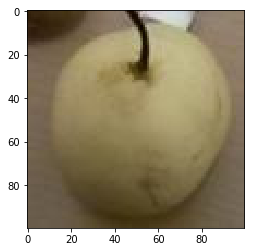

testing image============== 376
pear
I am 100.00% sure


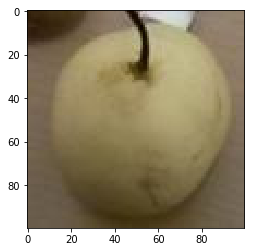

testing image============== 377
pear
I am 100.00% sure


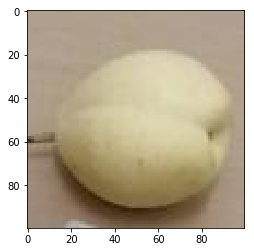

testing image============== 378
pear
I am 100.00% sure


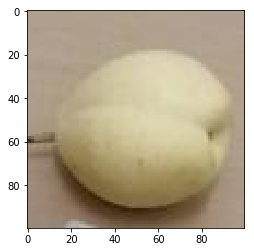

testing image============== 379
pear
I am 100.00% sure


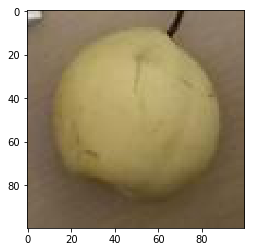

testing image============== 380
pear
I am 100.00% sure


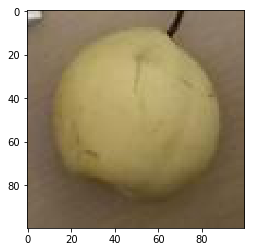

testing image============== 381
pear
I am 100.00% sure


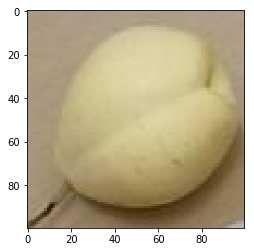

testing image============== 382
pear
I am 100.00% sure


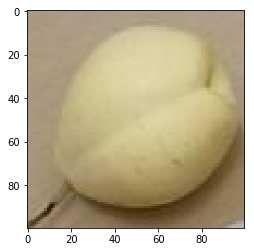

testing image============== 383
pear
I am 100.00% sure


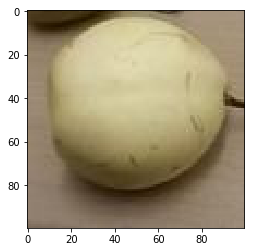

testing image============== 384
pear
I am 100.00% sure


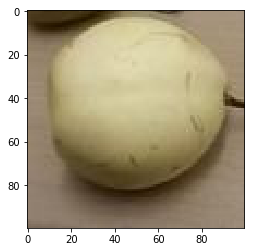

testing image============== 385
pear
I am 100.00% sure


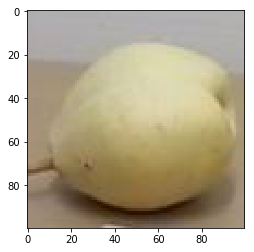

testing image============== 386
pear
I am 100.00% sure


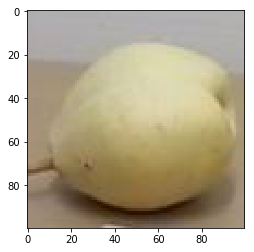

testing image============== 387
pear
I am 100.00% sure


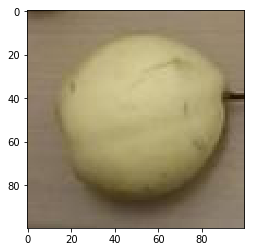

testing image============== 388
pear
I am 100.00% sure


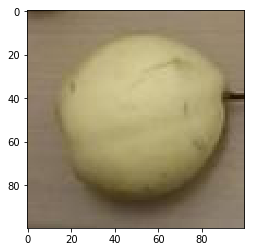

testing image============== 389
pear
I am 100.00% sure


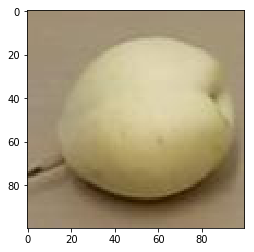

testing image============== 390
pear
I am 100.00% sure


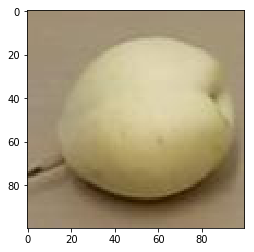

testing image============== 391
pear
I am 100.00% sure


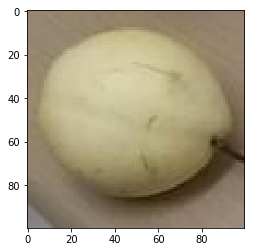

testing image============== 392
pear
I am 100.00% sure


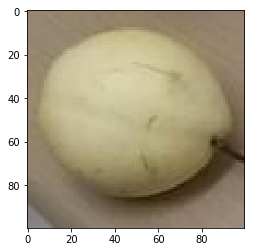

testing image============== 393
pear
I am 100.00% sure


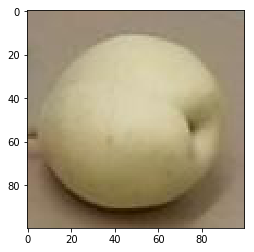

testing image============== 394
pear
I am 100.00% sure


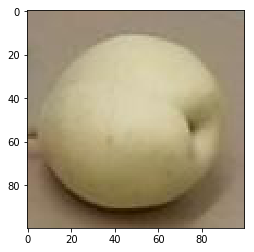

testing image============== 395
pear
I am 100.00% sure


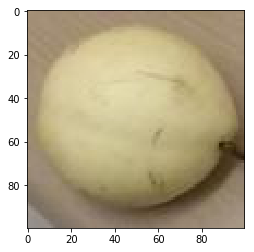

testing image============== 396
pear
I am 100.00% sure


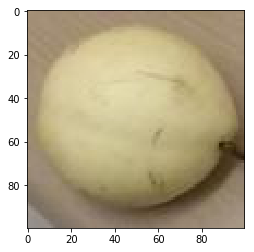

testing image============== 397
pear
I am 100.00% sure


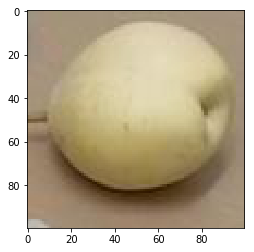

testing image============== 398
pear
I am 100.00% sure


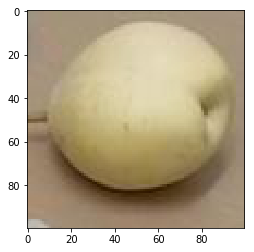

testing image============== 399
pear
I am 100.00% sure


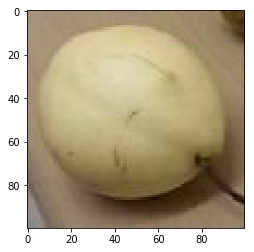

testing image============== 400
persimmon
I am 100.00% sure


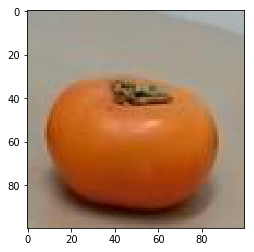

testing image============== 401
persimmon
I am 100.00% sure


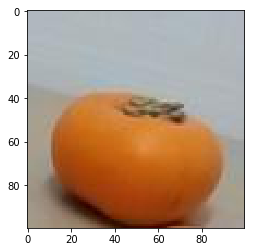

testing image============== 402
persimmon
I am 100.00% sure


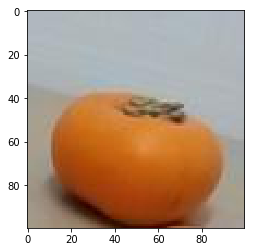

testing image============== 403
persimmon
I am 100.00% sure


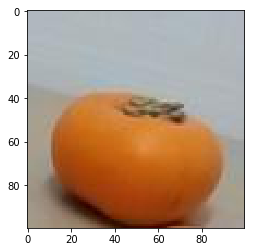

testing image============== 404
persimmon
I am 100.00% sure


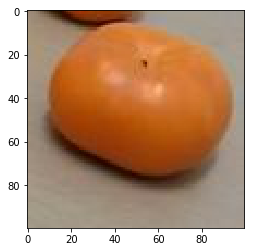

testing image============== 405
persimmon
I am 100.00% sure


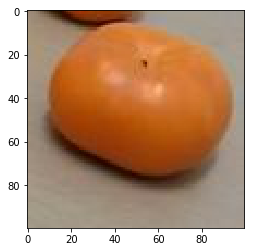

testing image============== 406
persimmon
I am 100.00% sure


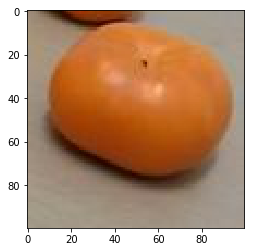

testing image============== 407
persimmon
I am 100.00% sure


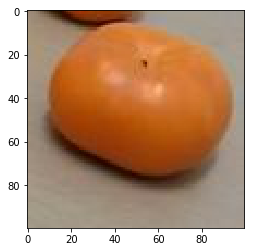

testing image============== 408
persimmon
I am 100.00% sure


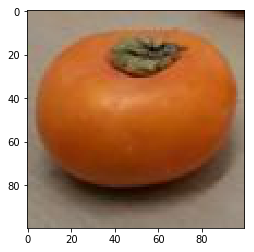

testing image============== 409
persimmon
I am 100.00% sure


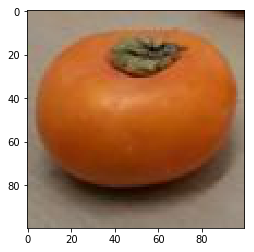

testing image============== 410
persimmon
I am 100.00% sure


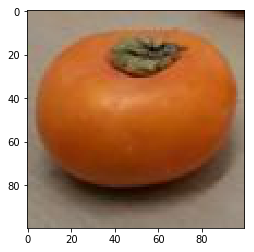

testing image============== 411
persimmon
I am 100.00% sure


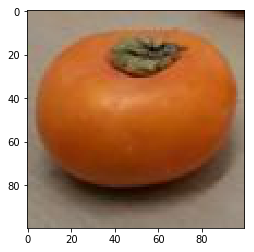

testing image============== 412
persimmon
I am 100.00% sure


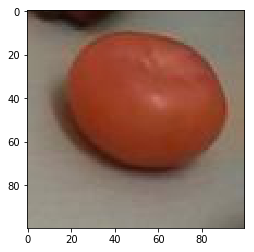

testing image============== 413
persimmon
I am 100.00% sure


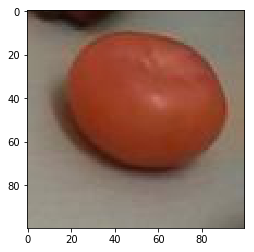

testing image============== 414
persimmon
I am 100.00% sure


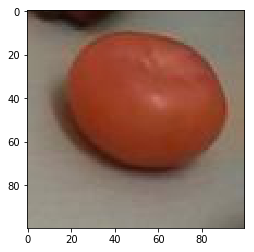

testing image============== 415
persimmon
I am 100.00% sure


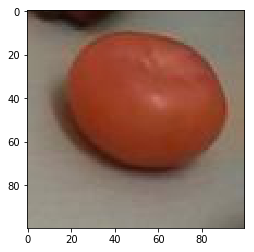

testing image============== 416
persimmon
I am 100.00% sure


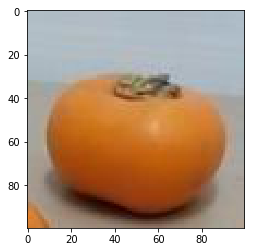

testing image============== 417
persimmon
I am 100.00% sure


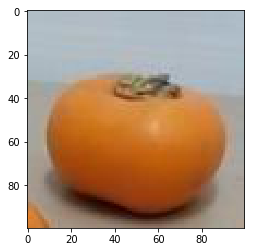

testing image============== 418
persimmon
I am 100.00% sure


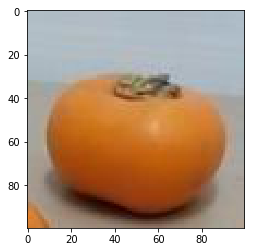

testing image============== 419
persimmon
I am 100.00% sure


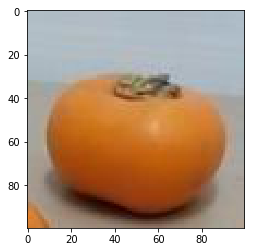

testing image============== 420
persimmon
I am 100.00% sure


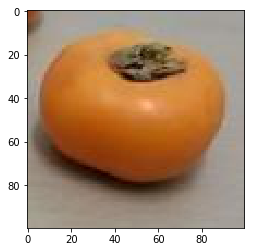

testing image============== 421
persimmon
I am 100.00% sure


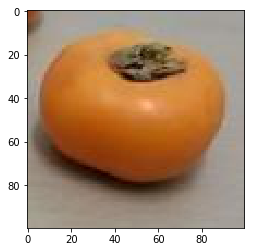

testing image============== 422
persimmon
I am 100.00% sure


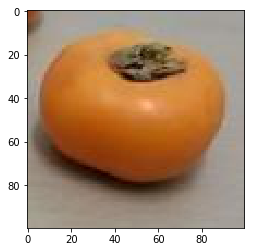

testing image============== 423
persimmon
I am 100.00% sure


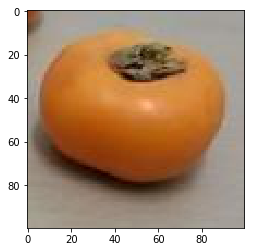

testing image============== 424
persimmon
I am 100.00% sure


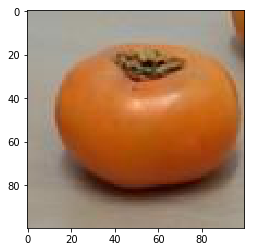

testing image============== 425
persimmon
I am 100.00% sure


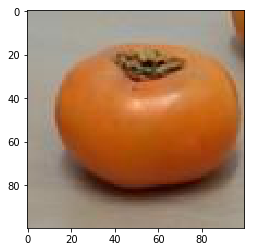

testing image============== 426
persimmon
I am 100.00% sure


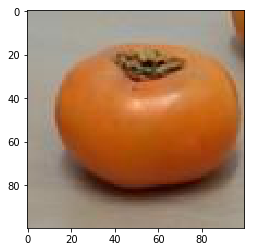

testing image============== 427
persimmon
I am 100.00% sure


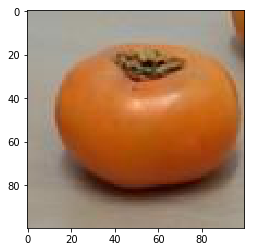

testing image============== 428
persimmon
I am 100.00% sure


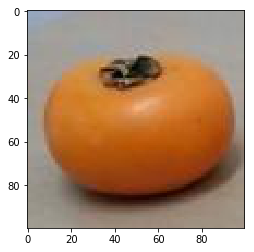

testing image============== 429
persimmon
I am 100.00% sure


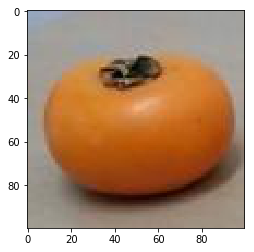

testing image============== 430
persimmon
I am 100.00% sure


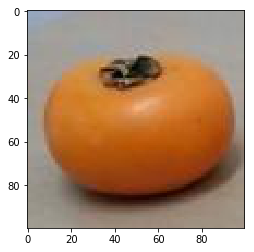

testing image============== 431
persimmon
I am 100.00% sure


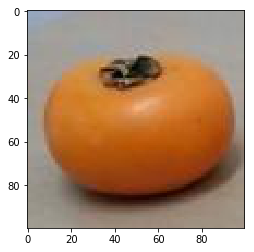

testing image============== 432
persimmon
I am 100.00% sure


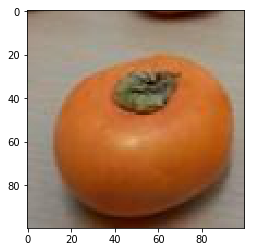

testing image============== 433
persimmon
I am 100.00% sure


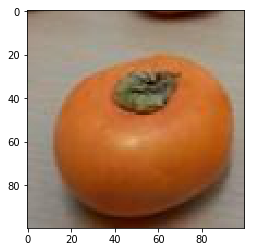

testing image============== 434
persimmon
I am 100.00% sure


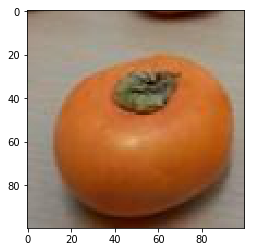

testing image============== 435
persimmon
I am 100.00% sure


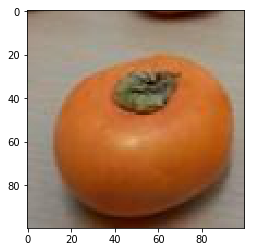

testing image============== 436
persimmon
I am 100.00% sure


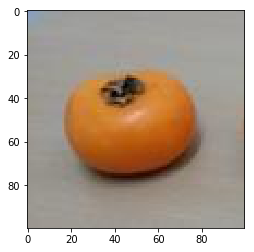

testing image============== 437
persimmon
I am 100.00% sure


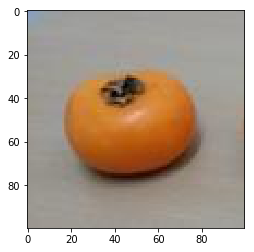

testing image============== 438
persimmon
I am 100.00% sure


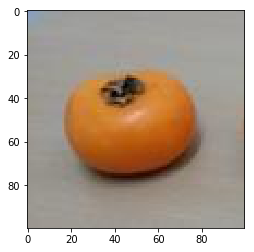

testing image============== 439
persimmon
I am 100.00% sure


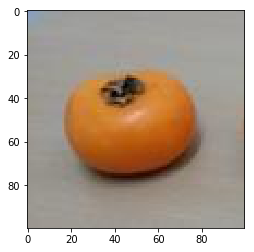

testing image============== 440
persimmon
I am 100.00% sure


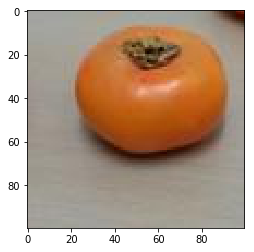

testing image============== 441
persimmon
I am 100.00% sure


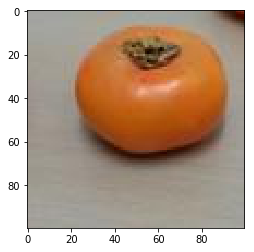

testing image============== 442
persimmon
I am 100.00% sure


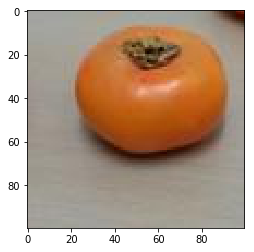

testing image============== 443
persimmon
I am 100.00% sure


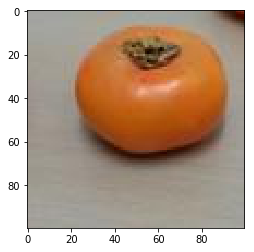

testing image============== 444
persimmon
I am 100.00% sure


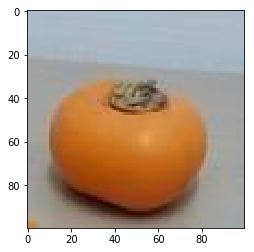

testing image============== 445
persimmon
I am 100.00% sure


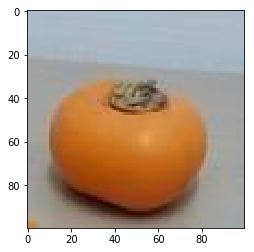

testing image============== 446
persimmon
I am 100.00% sure


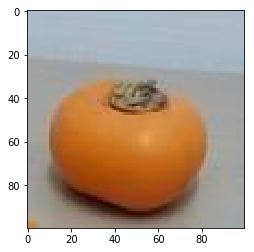

testing image============== 447
persimmon
I am 100.00% sure


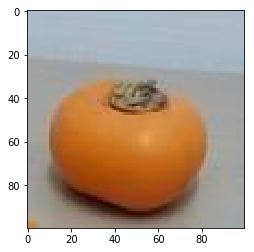

testing image============== 448
persimmon
I am 100.00% sure


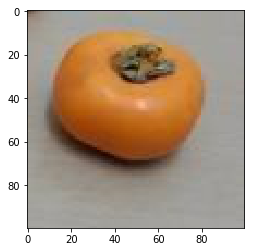

testing image============== 449
persimmon
I am 100.00% sure


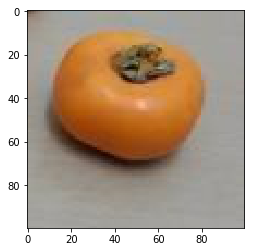

testing image============== 450
persimmon
I am 100.00% sure


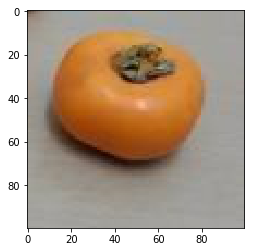

testing image============== 451
persimmon
I am 100.00% sure


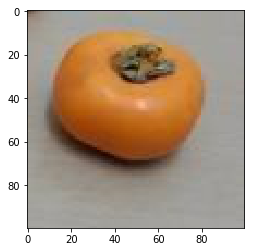

testing image============== 452
persimmon
I am 100.00% sure


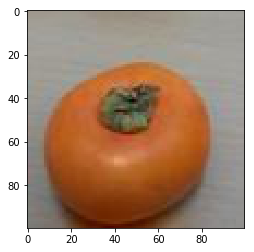

testing image============== 453
persimmon
I am 100.00% sure


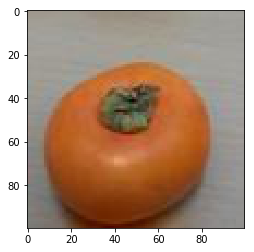

testing image============== 454
persimmon
I am 100.00% sure


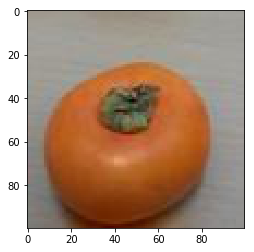

testing image============== 455
persimmon
I am 100.00% sure


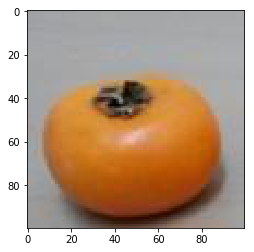

testing image============== 456
persimmon
I am 100.00% sure


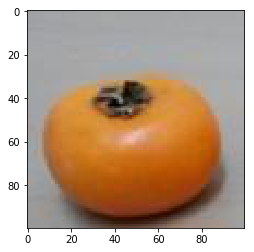

testing image============== 457
persimmon
I am 100.00% sure


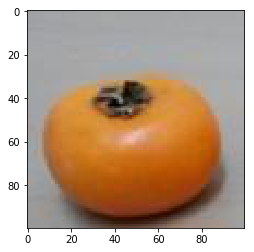

testing image============== 458
persimmon
I am 100.00% sure


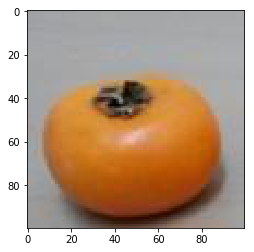

testing image============== 459
persimmon
I am 100.00% sure


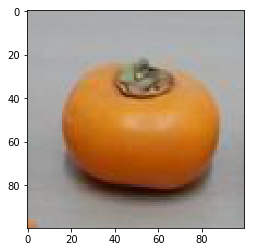

testing image============== 460
persimmon
I am 100.00% sure


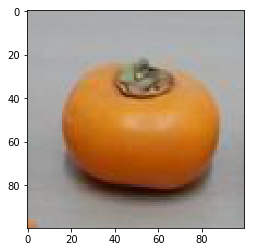

testing image============== 461
persimmon
I am 100.00% sure


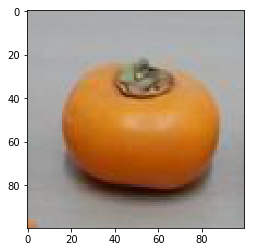

testing image============== 462
persimmon
I am 100.00% sure


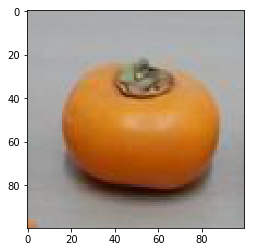

testing image============== 463
persimmon
I am 100.00% sure


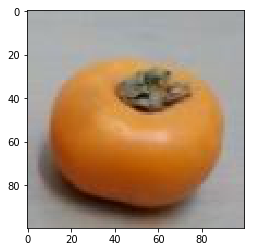

testing image============== 464
persimmon
I am 100.00% sure


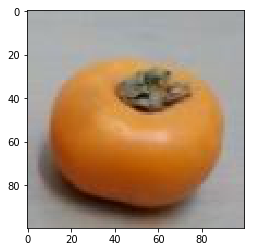

testing image============== 465
persimmon
I am 100.00% sure


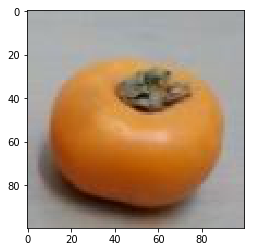

testing image============== 466
persimmon
I am 100.00% sure


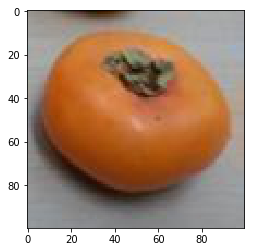

testing image============== 467
persimmon
I am 100.00% sure


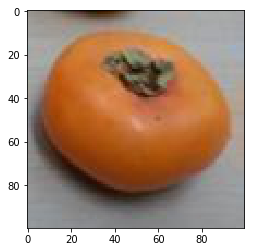

testing image============== 468
persimmon
I am 100.00% sure


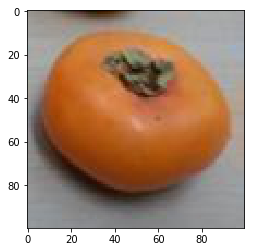

testing image============== 469
persimmon
I am 100.00% sure


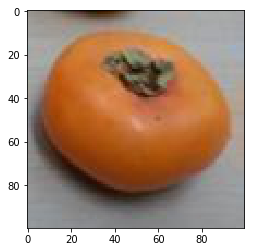

testing image============== 470
persimmon
I am 100.00% sure


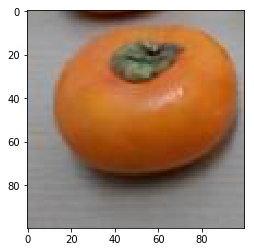

testing image============== 471
persimmon
I am 100.00% sure


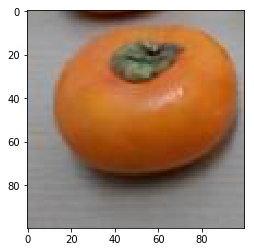

testing image============== 472
persimmon
I am 100.00% sure


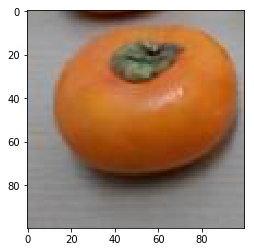

testing image============== 473
persimmon
I am 100.00% sure


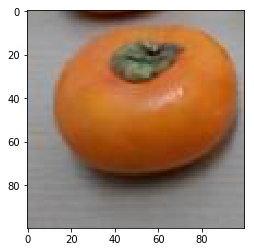

testing image============== 474
persimmon
I am 100.00% sure


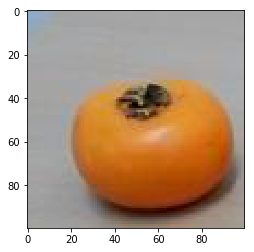

testing image============== 475
persimmon
I am 100.00% sure


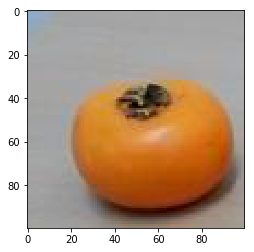

testing image============== 476
persimmon
I am 100.00% sure


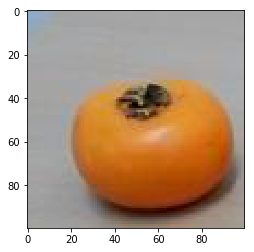

testing image============== 477
persimmon
I am 100.00% sure


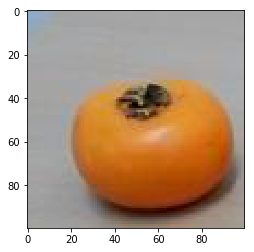

testing image============== 478
persimmon
I am 100.00% sure


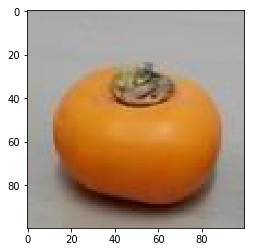

testing image============== 479
persimmon
I am 100.00% sure


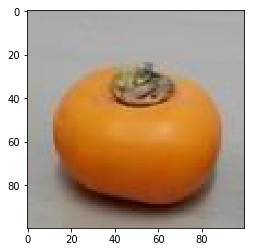

testing image============== 480
persimmon
I am 100.00% sure


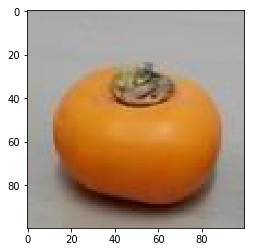

testing image============== 481
persimmon
I am 100.00% sure


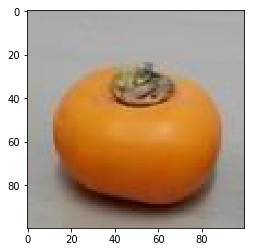

testing image============== 482
persimmon
I am 100.00% sure


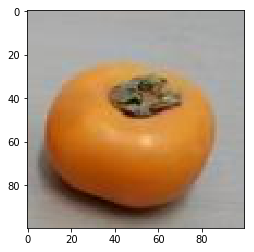

testing image============== 483
persimmon
I am 100.00% sure


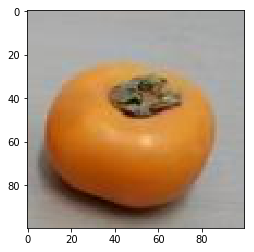

testing image============== 484
persimmon
I am 100.00% sure


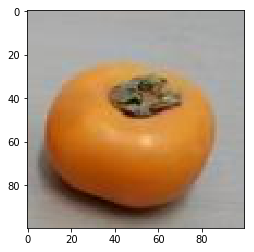

testing image============== 485
persimmon
I am 100.00% sure


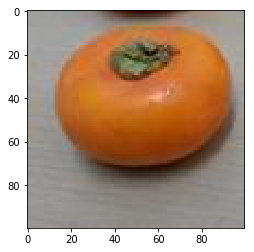

testing image============== 486
persimmon
I am 100.00% sure


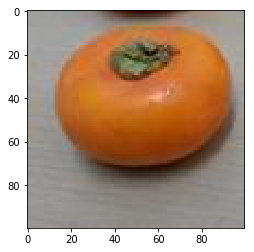

testing image============== 487
persimmon
I am 100.00% sure


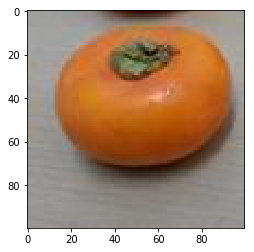

testing image============== 488
persimmon
I am 100.00% sure


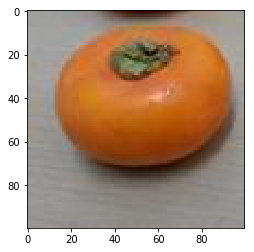

testing image============== 489
persimmon
I am 100.00% sure


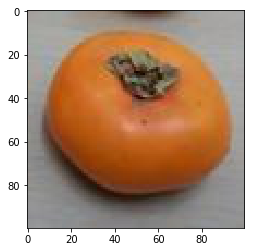

testing image============== 490
persimmon
I am 100.00% sure


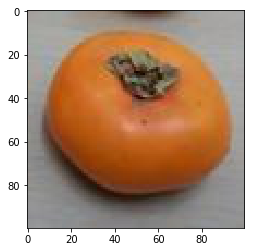

testing image============== 491
persimmon
I am 100.00% sure


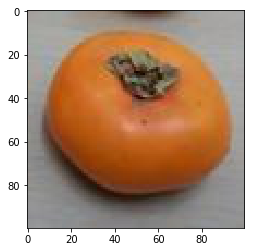

testing image============== 492
persimmon
I am 100.00% sure


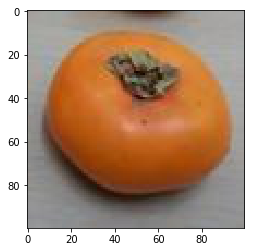

testing image============== 493
persimmon
I am 100.00% sure


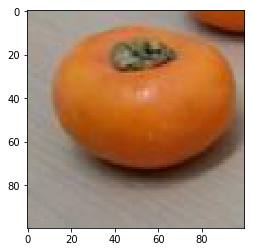

testing image============== 494
persimmon
I am 100.00% sure


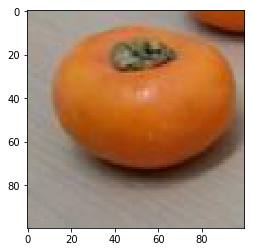

testing image============== 495
persimmon
I am 100.00% sure


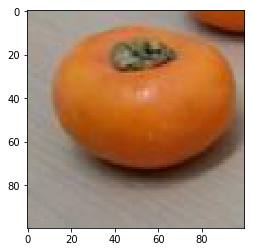

testing image============== 496
persimmon
I am 100.00% sure


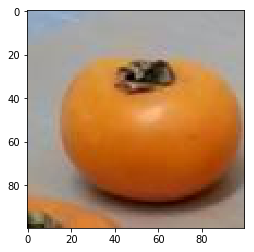

testing image============== 497
persimmon
I am 100.00% sure


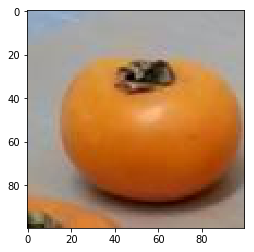

testing image============== 498
persimmon
I am 100.00% sure


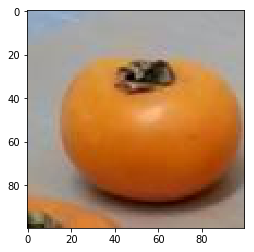

testing image============== 499
persimmon
I am 100.00% sure


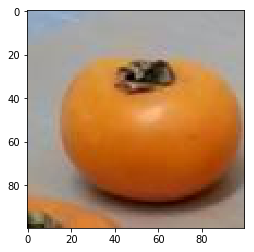

<Figure size 432x288 with 0 Axes>

In [27]:
for i in range(0,500):
    print("testing image==============",i )
    ind = np.argmax(predictions[i])
    #if ((predictions[i][ind])*100) < 1:
        #plt.imshow(test[i].T)
        #plt.show()
        #continue
    #else:     
    if ind ==0:
        print("apple")
    elif ind ==1:
        print("kiwi")
    elif ind ==2:
        print("orange")
    elif ind ==3:
        print("pear")
    elif ind ==4:
        print("persimmon")      
    print("============================================================================")
    print('I am {:.2%} sure'.format(predictions[i][ind]))


    plt.imshow(test[i].T)
    plt.show()
    plt.savefig('five.png')     

In [28]:
print("%s: %.2f%%" % (model.metrics_names[1], score[1]*100))

acc: 99.78%


In [29]:
print(model.metrics_names)

['loss', 'acc', 'f1_score']


In [30]:
print("%s: %.2f%%" % (model.metrics_names[2], score[2]*100))

f1_score: 88.79%


In [31]:
print('\nTest result: %.3f loss: %.3f f1_score: %.3f' % (score[1]*100,score[0], score[2]))


Test result: 99.780 loss: 0.016 f1_score: 0.888


In [32]:
from sklearn.metrics import precision_recall_fscore_support as score
#tue=[2,2,2,2,2,2,2,2,2,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,3,3,3,3,3,3,3,3,3,3,5,5,5,5,5,5,5,5,5,5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,6,6,6,6,6,6,6,6,7,7,7,7,7,7,7,7,7,7,4,4,4,4,4,4,4,4,4,4,4,4,4,4]
#prds= [2,3,3,5,3,2,2,3,2,0,0,1,1,0,7,7,1,1,7,5,7,1,5,1,3,3,3,3,3,3,3,3,3,3,7,5,5,5,5,5,7,5,3,5,5,1,1,7,0,0,5,0,7,3,1,5,7,0,7,0,0,6,6,6,6,6,6,6,6,7,7,7,7,7,7,7,7,7,7,4,4,5,4,4,6,6,6,4,4,3,3,4,6]
target_names = ['apple','kiwi', 'orange', 'pear', 'persimmon']
from sklearn.metrics import classification_report
#print(classification_report(tue, prds, target_names=target_names))
print(classification_report(tue, pred, target_names=target_names))

             precision    recall  f1-score   support

      apple       1.00      0.99      1.00       101
       kiwi       0.99      0.99      0.99       100
     orange       0.99      0.99      0.99       100
       pear       0.99      0.99      0.99       100
  persimmon       0.99      1.00      0.99        99

avg / total       0.99      0.99      0.99       500



In [33]:
print(labels)

[4, 0, 3, 1, 1, 4, 0, 4, 3, 4, 2, 1, 1, 0, 3, 2, 0, 4, 4, 4, 1, 0, 3, 4, 1, 1, 3, 1, 0, 0, 3, 1, 2, 1, 1, 0, 4, 3, 4, 0, 2, 1, 1, 3, 3, 3, 4, 1, 2, 0, 2, 3, 4, 3, 3, 4, 4, 0, 1, 4, 0, 0, 3, 4, 2, 1, 3, 4, 4, 3, 1, 3, 0, 3, 0, 4, 1, 2, 1, 2, 1, 2, 1, 4, 0, 2, 1, 4, 4, 0, 1, 4, 4, 2, 0, 2, 3, 3, 2, 2, 1, 1, 0, 4, 2, 0, 2, 1, 3, 0, 1, 1, 2, 4, 2, 1, 1, 0, 4, 2, 3, 0, 3, 2, 3, 4, 2, 4, 1, 2, 4, 1, 1, 3, 4, 3, 0, 4, 2, 3, 2, 2, 1, 4, 2, 2, 1, 2, 2, 0, 4, 4, 0, 3, 3, 3, 0, 0, 4, 0, 3, 3, 3, 0, 1, 1, 3, 3, 4, 1, 4, 2, 3, 0, 4, 3, 0, 3, 0, 1, 3, 3, 1, 4, 1, 1, 3, 1, 1, 0, 3, 0, 4, 1, 3, 1, 3, 4, 3, 3, 2, 1, 4, 2, 1, 1, 0, 4, 0, 2, 3, 1, 2, 1, 4, 2, 4, 2, 4, 2, 3, 2, 2, 1, 4, 3, 2, 3, 4, 3, 1, 1, 3, 1, 2, 0, 1, 2, 0, 1, 4, 3, 3, 1, 4, 2, 1, 0, 2, 3, 0, 0, 4, 3, 0, 0, 4, 2, 2, 0, 2, 3, 0, 4, 2, 4, 4, 4, 2, 2, 3, 2, 2, 0, 1, 3, 3, 1, 1, 3, 3, 2, 2, 0, 3, 0, 3, 1, 1, 1, 3, 3, 0, 1, 1, 4, 0, 4, 2, 2, 0, 4, 3, 3, 4, 4, 2, 4, 4, 2, 2, 1, 3, 1, 1, 3, 4, 4, 4, 0, 3, 1, 0, 0, 2, 4, 0, 3, 3, 3, 1, 0, 0, 

In [34]:
print(format(predictions[i][ind]))

1.0


In [35]:
print(i)
print(ind)

499
4
